In [1]:
# Import von Bibliotheken
from datasets import load_dataset
import urllib.request
import io,re
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import seaborn as sns
# Einlesen weiterer Bibliotheken
import os
# Deutsche Stopwörter laden
!pip install nltk
import nltk
from nltk.tokenize import word_tokenize
nltk.download('punkt')

from nltk.corpus import stopwords
nltk.download('stopwords')
stopwords = stopwords.words('german')

from sklearn.feature_extraction.text import CountVectorizer
from transformers import AutoModelForSequenceClassification, AutoTokenizer, pipeline
!pip install sentence-transformers

[nltk_data] Downloading package punkt to /home/haloh001/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /home/haloh001/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [2]:
!pip install "transformers==4.47.1" "sentence-transformers"
from sentence_transformers import SentenceTransformer

In [3]:
!pip install bertopic
!pip uninstall -y umap umap-learn
!pip install umap-learn
from umap import UMAP
import hdbscan
import umap
from bertopic import BERTopic
from bertopic.vectorizers import ClassTfidfTransformer

Found existing installation: umap-learn 0.5.12
Uninstalling umap-learn-0.5.12:
  Successfully uninstalled umap-learn-0.5.12
  Using cached umap_learn-0.5.12-py3-none-any.whl.metadata (24 kB)
Using cached umap_learn-0.5.12-py3-none-any.whl (91 kB)


In [4]:
# Einlesen der Langwahlprogramme (aus JSON-Format in ein Wörterbuch)

# für CDU/CSU
with open("cdu-wahlprogramm_2025_absatzweise.json", "r", encoding="utf-8") as datei:
    CDU_text_json = json.load(datei)

# für SPD
with open("spd-wahlprogramm_2025_absatzweise.json", "r", encoding="utf-8") as datei:
    SPD_text_json = json.load(datei)

# für Die Linke
with open("linke-wahlprogramm_2025_absatzweise.json", "r", encoding="utf-8") as datei:
    Linke_text_json = json.load(datei)

# für die AfD
with open("afd-wahlprogramm_2025_absatzweise.json", "r", encoding="utf-8") as datei:
    AfD_text_json = json.load(datei)

# für Bündnis 90/Grüne
with open("gruene-wahlprogramm_2025_absatzweise.json", "r", encoding="utf-8") as datei:
    Grüne_text_json = json.load(datei)

# für FDP
with open("fdp-wahlprogramm_2025_absatzweise.json", "r", encoding="utf-8") as datei:
    FDP_text_json = json.load(datei)

In [5]:
# Überführen aller 'eigentlichen' Texte in eine Liste pro Partei, d.h. ohne Kapitelüberschriften

# Suchfunktion in den "Partei-Wörterbüchern"

def finde_gefilterte_texte(struktur):
    ergebnisse = []
    
    # Fall A: Wenn das aktuelle Element ein Dictionary ist
    if isinstance(struktur, dict):
        # Typ/Art auslesen (liefert None, wenn der Schlüssel fehlt)
        aktueller_typ = struktur.get('type') or struktur.get('art')            # nur Suchen in diesen Elementen
        
        # Prüfen, ob 'text' existiert und der gefundene Typ gültig ist
        if 'text' in struktur and aktueller_typ in ['paragraph', 'bullet', 'absatz']:   # nur Texte überführen mit diesem Typ
            ergebnisse.append(struktur['text'])
        
        # Tiefer in alle Werte schauen für eventuelle Verschachtelungen
        for wert in struktur.values():
            ergebnisse.extend(finde_gefilterte_texte(wert))
                
    # Fall B: Wenn das aktuelle Element eine Liste ist
    elif isinstance(struktur, list):
        for element in struktur:
            ergebnisse.extend(finde_gefilterte_texte(element))
            
    return ergebnisse

CDU_text = finde_gefilterte_texte(CDU_text_json)
#CDU_text = CDU_text[135:]   # da vor der eigentlichen Langfassung im CDU/CSU-Programm noch eine Kurzfassung vorangeht, wird diese ausgeblendet
SPD_text = finde_gefilterte_texte(SPD_text_json)
Linke_text = finde_gefilterte_texte(Linke_text_json)
Grüne_text = finde_gefilterte_texte(Grüne_text_json)
AfD_text = finde_gefilterte_texte(AfD_text_json)
FDP_text = finde_gefilterte_texte(FDP_text_json)

In [6]:
# durchschnittliche Anzahl der Länge jedes einzelnen Dokuments pro Partei VOR BEREINIGUNG
# zur Orientierung die Anzahl der Absätze mit einer Länge von max. 100 Zeichen
durchschnitt_CDU = round(sum(len(s) for s in CDU_text) / len(CDU_text),1)
anzahl_CDU = len([i for i in CDU_text if len(i) < 100])
print("Durchschnittliche Zeichenlänge eines Absatzes im CDU-Programm: ",durchschnitt_CDU)
print("Anzahl aller Absätze: ",len(CDU_text))
print("Anzahl der Absätze mit einer Länge von < 100 Zeichen: ",anzahl_CDU)
print("-----")
durchschnitt_SPD = round(sum(len(s) for s in SPD_text) / len(SPD_text),1)
anzahl_SPD = len([i for i in SPD_text if len(i) < 100])
print("Durchschnittliche Zeichenlänge eines Absatzes im SPD-Programm: ",durchschnitt_SPD)
print("Anzahl aller Absätze: ",len(SPD_text))
print("Anzahl der Absätze mit einer Länge von < 100 Zeichen: ",anzahl_SPD)
print("-----")
durchschnitt_Linke = round(sum(len(s) for s in Linke_text) / len(Linke_text),1)
anzahl_Linke = len([i for i in Linke_text if len(i) < 100])
print("Durchschnittliche Zeichenlänge eines Absatzes im Linke-Programm: ",durchschnitt_Linke)
print("Anzahl aller Absätze: ",len(Linke_text))
print("Anzahl der Absätze mit einer Länge von < 100 Zeichen: ",anzahl_Linke)
print("-----")
durchschnitt_AfD = round(sum(len(s) for s in AfD_text) / len(AfD_text),1)
anzahl_AfD = len([i for i in AfD_text if len(i) < 100])
print("Durchschnittliche Zeichenlänge eines Absatzes im AfD-Programm: ",durchschnitt_AfD)
print("Anzahl aller Absätze: ",len(AfD_text))
print("Anzahl der Absätze mit einer Länge von < 100 Zeichen: ",anzahl_AfD)
print("-----")
durchschnitt_Grüne = round(sum(len(s) for s in Grüne_text) / len(Grüne_text),1)
anzahl_Grüne = len([i for i in Grüne_text if len(i) < 100])
print("Durchschnittliche Zeichenlänge eines Absatzes im Grüne-Programm: ",durchschnitt_Grüne)
print("Anzahl aller Absätze: ",len(Grüne_text))
print("Anzahl der Absätze mit einer Länge von < 100 Zeichen: ",anzahl_Grüne)
print("-----")
durchschnitt_FDP = round(sum(len(s) for s in FDP_text) / len(FDP_text),1)
anzahl_FDP = len([i for i in FDP_text if len(i) < 100])
print("Durchschnittliche Zeichenlänge eines Absatzes im FDP-Programm: ",durchschnitt_FDP)
print("Anzahl aller Absätze: ",len(FDP_text))
print("Anzahl der Absätze mit einer Länge von < 100 Zeichen: ",anzahl_FDP)
print("-----")

Durchschnittliche Zeichenlänge eines Absatzes im CDU-Programm:  257.4
Anzahl aller Absätze:  795
Anzahl der Absätze mit einer Länge von < 100 Zeichen:  153
-----
Durchschnittliche Zeichenlänge eines Absatzes im SPD-Programm:  465.3
Anzahl aller Absätze:  444
Anzahl der Absätze mit einer Länge von < 100 Zeichen:  15
-----
Durchschnittliche Zeichenlänge eines Absatzes im Linke-Programm:  380.0
Anzahl aller Absätze:  665
Anzahl der Absätze mit einer Länge von < 100 Zeichen:  30
-----
Durchschnittliche Zeichenlänge eines Absatzes im AfD-Programm:  299.6
Anzahl aller Absätze:  717
Anzahl der Absätze mit einer Länge von < 100 Zeichen:  108
-----
Durchschnittliche Zeichenlänge eines Absatzes im Grüne-Programm:  649.5
Anzahl aller Absätze:  583
Anzahl der Absätze mit einer Länge von < 100 Zeichen:  7
-----
Durchschnittliche Zeichenlänge eines Absatzes im FDP-Programm:  751.7
Anzahl aller Absätze:  200
Anzahl der Absätze mit einer Länge von < 100 Zeichen:  1
-----


In [7]:
# für das Wahlprogramm der FDP

FDP_text = [text for text in FDP_text if len(text) >= 60]
durchschnitt_FDP_neu = round(sum(len(s) for s in FDP_text) / len(FDP_text),1)
anzahl_FDP_neu = len([i for i in FDP_text if len(i) < 100])
print("Aktualisierte durchschnittliche Länge eines Absatzes im FDP-Programm: ",durchschnitt_FDP_neu, "(alt: ",durchschnitt_FDP, ")")
print("Aktualisierte Anzahl der Absätze mit einer Länge von < 100 Zeichen: ",anzahl_FDP_neu, "(alt: ",anzahl_FDP, ")")

Aktualisierte durchschnittliche Länge eines Absatzes im FDP-Programm:  755.3 (alt:  751.7 )
Aktualisierte Anzahl der Absätze mit einer Länge von < 100 Zeichen:  0 (alt:  1 )


In [8]:
# Herauslöschen der unerwünschten Texte
# wir gehen nicht nach Länge, da teils längere Text inhaltslos sind und kürzere nicht
# manuelles Löschen bevorzugt statt pauschales Löschen z.B. "alles < 60 Zeichen"

# einzelne Löschen von Indizes verschiebt diese, daher der Weg über eine Liste
loesch_indizes = {1, 8, 11, 13, 22, 33, 34, 35, 52}

# Neue Liste erstellen ohne die unerwünschten Indizes
SPD_text = [element for index, element in enumerate(SPD_text) if index not in loesch_indizes]

durchschnitt_SPD_neu = round(sum(len(s) for s in SPD_text) / len(SPD_text),1)
anzahl_SPD_neu = len([i for i in SPD_text if len(i) < 100])
print("Aktualisierte durchschnittliche Länge eines Absatzes im SPD-Programm: ",durchschnitt_SPD_neu, "(alt: ",durchschnitt_SPD, ")")
print("Aktualisierte Anzahl der Absätze mit einer Länge von < 100 Zeichen: ",anzahl_SPD_neu, "(alt: ",anzahl_SPD, ")")

Aktualisierte durchschnittliche Länge eines Absatzes im SPD-Programm:  473.6 (alt:  465.3 )
Aktualisierte Anzahl der Absätze mit einer Länge von < 100 Zeichen:  6 (alt:  15 )


In [9]:
# Herauslöschen der unerwünschten Texte, analog des Ansatzes bei der SPD
loesch_indizes = {13, 75, 93, 101, 104, 106, 115}
Linke_text = [element for index, element in enumerate(Linke_text) if index not in loesch_indizes]

durchschnitt_Linke_neu = round(sum(len(s) for s in Linke_text) / len(Linke_text),1)
anzahl_Linke_neu = len([i for i in Linke_text if len(i) < 100])
print("Aktualisierte durchschnittliche Länge eines Absatzes im Linke-Programm: ",durchschnitt_Linke_neu, "(alt: ",durchschnitt_Linke, ")")
print("Aktualisierte Anzahl der Absätze mit einer Länge von < 100 Zeichen: ",anzahl_Linke_neu, "(alt: ",anzahl_Linke, ")")

Aktualisierte durchschnittliche Länge eines Absatzes im Linke-Programm:  383.5 (alt:  380.0 )
Aktualisierte Anzahl der Absätze mit einer Länge von < 100 Zeichen:  23 (alt:  30 )


In [10]:
# Herauslöschen der unerwünschten Texte, analog des Ansatzes bei der SPD
loesch_indizes = {8, 10, 13, 16, 23, 24}
Grüne_text = [element for index, element in enumerate(Grüne_text) if index not in loesch_indizes]

durchschnitt_Grüne_neu = round(sum(len(s) for s in Grüne_text) / len(Grüne_text),1)
anzahl_Grüne_neu = len([i for i in Grüne_text if len(i) < 100])
print("Aktualisierte durchschnittliche Länge eines Absatzes im Grüne-Programm: ",durchschnitt_Grüne_neu, "(alt: ",durchschnitt_Grüne, ")")
print("Aktualisierte Anzahl der Absätze mit einer Länge von < 100 Zeichen: ",anzahl_Grüne_neu, "(alt: ",anzahl_Grüne, ")")

Aktualisierte durchschnittliche Länge eines Absatzes im Grüne-Programm:  655.2 (alt:  649.5 )
Aktualisierte Anzahl der Absätze mit einer Länge von < 100 Zeichen:  4 (alt:  7 )


In [11]:
# Herauslöschen der unerwünschten Texte, analog des Ansatzes bei der SPD
loesch_indizes = {0,}
AfD_text = [element for index, element in enumerate(AfD_text) if index not in loesch_indizes]

durchschnitt_AfD_neu = round(sum(len(s) for s in AfD_text) / len(AfD_text),1)
anzahl_AfD_neu = len([i for i in AfD_text if len(i) < 100])
print("Aktualisierte durchschnittliche Länge eines Absatzes im AfD-Programm: ",durchschnitt_AfD_neu, "(alt: ",durchschnitt_AfD, ")")
print("Aktualisierte Anzahl der Absätze mit einer Länge von < 100 Zeichen: ",anzahl_AfD_neu, "(alt: ",anzahl_AfD, ")")

Aktualisierte durchschnittliche Länge eines Absatzes im AfD-Programm:  299.8 (alt:  299.6 )
Aktualisierte Anzahl der Absätze mit einer Länge von < 100 Zeichen:  108 (alt:  108 )


In [12]:
# Anderer Ansatz: Herauslöschen der Strings unter 90 Zeichen
# diese fassen im Vorfeld die Punkte zusammen, die anschließend ausführlich in längeren Fließtexten samt bullet points folgen

CDU_text = [text for text in CDU_text if len(text) >= 89]

durchschnitt_CDU_neu = round(sum(len(s) for s in CDU_text) / len(CDU_text),1)
anzahl_CDU_neu = len([i for i in CDU_text if len(i) < 100])
print("Aktualisierte durchschnittliche Länge eines Absatzes im CDU-Programm: ",durchschnitt_CDU_neu, "(alt: ",durchschnitt_CDU, ")")
print("Aktualisierte Anzahl der Absätze mit einer Länge von < 100 Zeichen: ",anzahl_CDU_neu, "(alt: ",anzahl_CDU, ")")

Aktualisierte durchschnittliche Länge eines Absatzes im CDU-Programm:  308.6 (alt:  257.4 )
Aktualisierte Anzahl der Absätze mit einer Länge von < 100 Zeichen:  4 (alt:  153 )


In [13]:
# aktualisierte durchschnittliche Länge jedes einzelnen Dokuments pro Partei NACH BEREINIGUNG
print("Durchschnittliche Länge eines Absatzes im CDU-Programm: ",durchschnitt_CDU_neu)
print("Anzahl der Gesamtabsätze: ",len(CDU_text))
print("Anzahl der Absätze mit einer Länge von < 100 Zeichen: ",anzahl_CDU_neu)
print("Verhältnis 'Absätze < 100 Zeichen' zu 'Gesamtabsätze' in %: ",round(anzahl_CDU_neu/len(CDU_text)*100,2))
print("-----")
print("Durchschnittliche Länge eines Absatzes im SPD-Programm: ",durchschnitt_SPD_neu)
print("Anzahl der Gesamtabsätze: ",len(SPD_text))
print("Anzahl der Absätze mit einer Länge von < 100 Zeichen: ",anzahl_SPD_neu)
print("Verhältnis 'Absätze < 100 Zeichen' zu 'Gesamtabsätze' in %: ",round(anzahl_SPD_neu/len(SPD_text)*100,2))
print("-----")
print("Durchschnittliche Länge eines Absatzes im Linke-Programm: ",durchschnitt_Linke_neu)
print("Anzahl der Gesamtabsätze: ",len(Linke_text))
print("Anzahl der Absätze mit einer Länge von < 100 Zeichen: ",anzahl_Linke_neu)
print("Verhältnis 'Absätze < 100 Zeichen' zu 'Gesamtabsätze' in %: ",round(anzahl_Linke_neu/len(Linke_text)*100,2))
print("-----")
print("Durchschnittliche Länge eines Absatzes im AfD-Programm: ",durchschnitt_AfD_neu)
print("Anzahl der Gesamtabsätze: ",len(AfD_text))
print("Anzahl der Absätze mit einer Länge von < 100 Zeichen: ",anzahl_AfD_neu)
print("Verhältnis 'Absätze < 100 Zeichen' zu 'Gesamtabsätze' in %: ",round(anzahl_AfD_neu/len(AfD_text)*100,2))
print("-----")
print("Durchschnittliche Länge eines Absatzes im Grüne-Programm: ",durchschnitt_Grüne_neu)
print("Anzahl der Gesamtabsätze: ",len(Grüne_text))
print("Anzahl der Absätze mit einer Länge von < 100 Zeichen: ",anzahl_Grüne_neu)
print("Verhältnis 'Absätze < 100 Zeichen' zu 'Gesamtabsätze' in %: ",round(anzahl_Grüne_neu/len(Grüne_text)*100,2))
print("-----")
print("Durchschnittliche Länge eines Absatzes im FDP-Programm: ",durchschnitt_FDP_neu)
print("Anzahl der Gesamtabsätze: ",len(FDP_text))
print("Anzahl der Absätze mit einer Länge von < 100 Zeichen: ",anzahl_FDP_neu)
print("Verhältnis 'Absätze < 100 Zeichen' zu 'Gesamtabsätze' in %: ",round(anzahl_FDP_neu/len(FDP_text)*100,2))
print("-----")

Durchschnittliche Länge eines Absatzes im CDU-Programm:  308.6
Anzahl der Gesamtabsätze:  646
Anzahl der Absätze mit einer Länge von < 100 Zeichen:  4
Verhältnis 'Absätze < 100 Zeichen' zu 'Gesamtabsätze' in %:  0.62
-----
Durchschnittliche Länge eines Absatzes im SPD-Programm:  473.6
Anzahl der Gesamtabsätze:  435
Anzahl der Absätze mit einer Länge von < 100 Zeichen:  6
Verhältnis 'Absätze < 100 Zeichen' zu 'Gesamtabsätze' in %:  1.38
-----
Durchschnittliche Länge eines Absatzes im Linke-Programm:  383.5
Anzahl der Gesamtabsätze:  658
Anzahl der Absätze mit einer Länge von < 100 Zeichen:  23
Verhältnis 'Absätze < 100 Zeichen' zu 'Gesamtabsätze' in %:  3.5
-----
Durchschnittliche Länge eines Absatzes im AfD-Programm:  299.8
Anzahl der Gesamtabsätze:  716
Anzahl der Absätze mit einer Länge von < 100 Zeichen:  108
Verhältnis 'Absätze < 100 Zeichen' zu 'Gesamtabsätze' in %:  15.08
-----
Durchschnittliche Länge eines Absatzes im Grüne-Programm:  655.2
Anzahl der Gesamtabsätze:  577
Anzahl 

In [14]:
# SCHRITT 2: ZUSAMMENFASSEN DER BULLET POINTS UND ANHÄNGEN DIESER 'GESAMMELTEN BULLET POINTS'
#            an an den vorherigen (normalen Fließtext-)Absatz (für Ziel 2)

# zunächst die Ermittlung wie viele Absätze 'bullet points' sind, d.h. mit Sonderzeichen wie Bindestrich oder '•' beginnen

print(f"Gefundene Strings im CDU/CSU-Wahlprogramm: {len(s := [t for t in CDU_text if t and not t[0].isalpha()])} von {len(CDU_text)} ({(len(s)/len(CDU_text)*100 if CDU_text else 0):.2f}%)")
print(f"Gefundene Strings im SPD-Wahlprogramm: {len(s := [t for t in SPD_text if t and not t[0].isalpha()])} von {len(SPD_text)} ({(len(s)/len(SPD_text)*100 if SPD_text else 0):.2f}%)")
print(f"Gefundene Strings im Linke-Wahlprogramm: {len(s := [t for t in Linke_text if t and not t[0].isalpha()])} von {len(Linke_text)} ({(len(s)/len(Linke_text)*100 if Linke_text else 0):.2f}%)")
print(f"Gefundene Strings im Grüne-Wahlprogramm: {len(s := [t for t in Grüne_text if t and not t[0].isalpha()])} von {len(Grüne_text)} ({(len(s)/len(Grüne_text)*100 if Grüne_text else 0):.2f}%)")
print(f"Gefundene Strings im AfD-Wahlprogramm: {len(s := [t for t in AfD_text if t and not t[0].isalpha()])} von {len(AfD_text)} ({(len(s)/len(AfD_text)*100 if AfD_text else 0):.2f}%)")
print(f"Gefundene Strings im FDP-Wahlprogramm: {len(s := [t for t in FDP_text if t and not t[0].isalpha()])} von {len(FDP_text)} ({(len(s)/len(FDP_text)*100 if FDP_text else 0):.2f}%)")


Gefundene Strings im CDU/CSU-Wahlprogramm: 545 von 646 (84.37%)
Gefundene Strings im SPD-Wahlprogramm: 16 von 435 (3.68%)
Gefundene Strings im Linke-Wahlprogramm: 481 von 658 (73.10%)
Gefundene Strings im Grüne-Wahlprogramm: 0 von 577 (0.00%)
Gefundene Strings im AfD-Wahlprogramm: 216 von 716 (30.17%)
Gefundene Strings im FDP-Wahlprogramm: 0 von 199 (0.00%)


In [15]:
# in anderem Notebook ermittelte Durchschnittswerte
cdu_avg_length = 281
spd_avg_length = 465
linke_avg_length = 380
grüne_avg_length = 650
afd_avg_length = 300
fdp_avg_length = 752

In [16]:
# Ermittlung der Kehrtwerte, die als Gewichtungsfaktoren für die spätere Kategorie-Zuteilung herangezogen werden

# für 'CDU_text'
# Der vorgegebene Mittelwert

# Neue Liste für die Ergebnisse
ergebnis_nach_zeichen = []

# 2. Liste iterieren und Verhältnis berechnen
for chunk in CDU_text:
    laenge_zeichen = len(chunk)
    
    # Berechnet: cdu_avg_length / zeichenlänge (verhindert Fehler bei leeren Texten)
    verhaeltnis = float(round(cdu_avg_length / laenge_zeichen,2))
    
    ergebnis_nach_zeichen.append(verhaeltnis)

# 3. Ausgabe der neuen Liste
kehrwert_cdu = []
for i in ergebnis_nach_zeichen:
    x = round(float(1/i),2)
    kehrwert_cdu.append(x)

In [17]:
# für 'SPD_text'
# Der vorgegebene Mittelwert

# Neue Liste für die Ergebnisse
ergebnis_nach_zeichen = []

# 2. Liste iterieren und Verhältnis berechnen
for chunk in SPD_text:
    laenge_zeichen = len(chunk)
    
    # Berechnet: cdu_avg_length / zeichenlänge (verhindert Fehler bei leeren Texten)
    verhaeltnis = float(round(spd_avg_length / laenge_zeichen,2))
    
    ergebnis_nach_zeichen.append(verhaeltnis)

# 3. Ausgabe der neuen Liste
kehrwert_spd = []
for i in ergebnis_nach_zeichen:
    x = round(float(1/i),2)
    kehrwert_spd.append(x)

In [18]:
# für 'Linke_text'
# Der vorgegebene Mittelwert

# Neue Liste für die Ergebnisse
ergebnis_nach_zeichen = []

# 2. Liste iterieren und Verhältnis berechnen
for chunk in Linke_text:
    laenge_zeichen = len(chunk)
    
    # Berechnet: cdu_avg_length / zeichenlänge (verhindert Fehler bei leeren Texten)
    verhaeltnis = float(round(linke_avg_length / laenge_zeichen,2))
    
    ergebnis_nach_zeichen.append(verhaeltnis)

# 3. Ausgabe der neuen Liste
kehrwert_linke = []
for i in ergebnis_nach_zeichen:
    x = round(float(1/i),2)
    kehrwert_linke.append(x)

In [19]:
# für 'Grüne_text'
# Der vorgegebene Mittelwert

# Neue Liste für die Ergebnisse
ergebnis_nach_zeichen = []

# 2. Liste iterieren und Verhältnis berechnen
for chunk in Grüne_text:
    laenge_zeichen = len(chunk)
    
    # Berechnet: cdu_avg_length / zeichenlänge (verhindert Fehler bei leeren Texten)
    verhaeltnis = float(round(grüne_avg_length / laenge_zeichen,2))
    
    ergebnis_nach_zeichen.append(verhaeltnis)

# 3. Ausgabe der neuen Liste
kehrwert_grüne = []
for i in ergebnis_nach_zeichen:
    x = round(float(1/i),2)
    kehrwert_grüne.append(x)

In [20]:
# für 'AfD_text'
# Der vorgegebene Mittelwert

# Neue Liste für die Ergebnisse
ergebnis_nach_zeichen = []

# 2. Liste iterieren und Verhältnis berechnen
for chunk in AfD_text:
    laenge_zeichen = len(chunk)
    
    # Berechnet: cdu_avg_length / zeichenlänge (verhindert Fehler bei leeren Texten)
    verhaeltnis = float(round(afd_avg_length / laenge_zeichen,2))
    
    ergebnis_nach_zeichen.append(verhaeltnis)

# 3. Ausgabe der neuen Liste
kehrwert_afd = []
for i in ergebnis_nach_zeichen:
    x = round(float(1/i),2)
    kehrwert_afd.append(x)

In [21]:
# für 'FDP_text'
# Der vorgegebene Mittelwert

# Neue Liste für die Ergebnisse
ergebnis_nach_zeichen = []

# 2. Liste iterieren und Verhältnis berechnen
for chunk in FDP_text:
    laenge_zeichen = len(chunk)
    
    # Berechnet: cdu_avg_length / zeichenlänge (verhindert Fehler bei leeren Texten)
    verhaeltnis = float(round(fdp_avg_length / laenge_zeichen,2))
    
    ergebnis_nach_zeichen.append(verhaeltnis)

# 3. Ausgabe der neuen Liste
kehrwert_fdp = []
for i in ergebnis_nach_zeichen:
    x = round(float(1/i),2)
    kehrwert_fdp.append(x)

In [22]:
# Liste wieder laden mit den eingelesenen und 'vorbereiteten' (um Phrasen, Einleitungen, Begrüßung usw. bereinigt...)

with open("text_liste_CDU_1_json.json", "r", encoding="utf-8") as f:
    text_liste_CDU_1_clean = json.load(f)

with open("text_liste_CDU_2_json.json", "r", encoding="utf-8") as f:
    text_liste_CDU_2_clean = json.load(f)

with open("text_liste_CDU_3_json.json", "r", encoding="utf-8") as f:
    text_liste_CDU_3_clean = json.load(f)

with open("text_liste_CDU_4_json.json", "r", encoding="utf-8") as f:
    text_liste_CDU_4_clean = json.load(f)

with open("text_liste_CDU_5_json.json", "r", encoding="utf-8") as f:
    text_liste_CDU_5_clean = json.load(f)

with open("text_liste_SPD_1_json.json", "r", encoding="utf-8") as f:
    text_liste_SPD_1_clean = json.load(f)

with open("text_liste_SPD_2_json.json", "r", encoding="utf-8") as f:
    text_liste_SPD_2_clean = json.load(f)

with open("text_liste_SPD_3_json.json", "r", encoding="utf-8") as f:
    text_liste_SPD_3_clean = json.load(f)

with open("text_liste_SPD_4_json.json", "r", encoding="utf-8") as f:
    text_liste_SPD_4_clean = json.load(f)

with open("text_liste_SPD_5_json.json", "r", encoding="utf-8") as f:
    text_liste_SPD_5_clean = json.load(f)

with open("text_liste_Linke_1_json.json", "r", encoding="utf-8") as f:
    text_liste_Linke_1_clean = json.load(f)

with open("text_liste_Linke_2_json.json", "r", encoding="utf-8") as f:
    text_liste_Linke_2_clean = json.load(f)

with open("text_liste_Linke_3_json.json", "r", encoding="utf-8") as f:
    text_liste_Linke_3_clean = json.load(f)

with open("text_liste_Linke_4_json.json", "r", encoding="utf-8") as f:
    text_liste_Linke_4_clean = json.load(f)

with open("text_liste_Linke_5_json.json", "r", encoding="utf-8") as f:
    text_liste_Linke_5_clean = json.load(f)

with open("text_liste_Grüne_1_json.json", "r", encoding="utf-8") as f:
    text_liste_Grüne_1_clean = json.load(f)

with open("text_liste_Grüne_2_json.json", "r", encoding="utf-8") as f:
    text_liste_Grüne_2_clean = json.load(f)

with open("text_liste_Grüne_3_json.json", "r", encoding="utf-8") as f:
    text_liste_Grüne_3_clean = json.load(f)

with open("text_liste_Grüne_4_json.json", "r", encoding="utf-8") as f:
    text_liste_Grüne_4_clean = json.load(f)

with open("text_liste_Grüne_5_json.json", "r", encoding="utf-8") as f:
    text_liste_Grüne_5_clean = json.load(f)

with open("text_liste_AfD_1_json.json", "r", encoding="utf-8") as f:
    text_liste_AfD_1_clean = json.load(f)

with open("text_liste_AfD_2_json.json", "r", encoding="utf-8") as f:
    text_liste_AfD_2_clean = json.load(f)

with open("text_liste_AfD_3_json.json", "r", encoding="utf-8") as f:
    text_liste_AfD_3_clean = json.load(f)

with open("text_liste_AfD_4_json.json", "r", encoding="utf-8") as f:
    text_liste_AfD_4_clean = json.load(f)

with open("text_liste_AfD_5_json.json", "r", encoding="utf-8") as f:
    text_liste_AfD_5_clean = json.load(f)

with open("text_liste_FDP_1_json.json", "r", encoding="utf-8") as f:
    text_liste_FDP_1_clean = json.load(f)

with open("text_liste_FDP_2_json.json", "r", encoding="utf-8") as f:
    text_liste_FDP_2_clean = json.load(f)

with open("text_liste_FDP_3_json.json", "r", encoding="utf-8") as f:
    text_liste_FDP_3_clean = json.load(f)

with open("text_liste_FDP_4_json.json", "r", encoding="utf-8") as f:
    text_liste_FDP_4_clean = json.load(f)

with open("text_liste_FDP_5_json.json", "r", encoding="utf-8") as f:
    text_liste_FDP_5_clean = json.load(f)

In [23]:
print(len(text_liste_CDU_4_clean))
print(len(text_liste_CDU_4_clean[0]))
print(text_liste_CDU_4_clean[0][:1000])

88
16464
Was war das denn? 25 Minuten abgelesene Empörung über den Oppositionsführer. Herzlichen Glückwunsch, Sie verwechseln den Plenarsaal des Deutschen Bundestages offensichtlich mit einem Juso-Bundeskongress. Wollen Sie uns allen Ernstes diese halbe Stunde hier heute Morgen zumuten als eine Abschlussbilanz Ihrer dreijährigen Amtszeit als Bundeskanzler der Bundesrepublik Deutschland? Ist das allen Ernstes das, was Sie sozusagen zum Abschluss dieser drei Jahre hier vortragen und anschließend den Bürgerinnen und Bürgern in Deutschland zur Fortsetzung anbieten? Wissen Sie, wie Sie mir vorkommen, Sie beide, Herr Habeck und Herr Scholz? Wie zwei angestellte Geschäftsführer, die das Unternehmen vor die Wand gefahren haben, anschließend zu den Eigentümern gehen und sagen: Wir würden das jetzt gerne noch mal vier Jahre so weitermachen. So kommen Sie mir vor. Wissen Sie, was im normalen Leben bei Ihnen ist das Jahrzehnte her, dass Sie es kennengelernt haben die Eigentümer sagen würden, wenn 

In [24]:
!pip install langchain_text_splitters
from langchain_text_splitters import RecursiveCharacterTextSplitter

def split_text(text):
    # chunk_size: Maximale Zeichenanzahl pro Abschnitt
    # chunk_overlap: Wie viele Zeichen vom vorherigen Abschnitt wiederholt werden
    splitter = RecursiveCharacterTextSplitter(
        chunk_size=800,       # -> entspricht ca. 100 Wörtern
        chunk_overlap=100,       # keine chun_overlap
        separators = ["\n\n", "\n", ". ", "? ", "! ", " ", ""] # Sucht erst nach Absätzen, dann Sätzen, dann Wörtern
    )

    # Gibt eine Liste von Strings zurück
    return splitter.split_text(text)

In [25]:
# Wahlprogramme nicht in chunks aufteilen; Annahme: Absätze behandeln i.d.R. ein Thema
CDU_WP_chunks = CDU_text
SPD_WP_chunks = SPD_text
Grüne_WP_chunks = Grüne_text
AfD_WP_chunks = AfD_text
Linke_WP_chunks = Linke_text
FDP_WP_chunks = FDP_text

# in integer verwandeln, wichtig für später zur Berechnung der Themenanteile

CDU_WP_chunks_len = len(CDU_WP_chunks)
SPD_WP_chunks_len = len(SPD_WP_chunks)
Grüne_WP_chunks_len = len(Grüne_WP_chunks)
AfD_WP_chunks_len = len(AfD_WP_chunks)
Linke_WP_chunks_len = len(Linke_WP_chunks)
FDP_WP_chunks_len = len(FDP_WP_chunks)

CDU_anteil = kehrwert_cdu
SPD_anteil = kehrwert_spd
Linke_anteil = kehrwert_linke
Grüne_anteil = kehrwert_grüne
AfD_anteil = kehrwert_afd
FDP_anteil = kehrwert_fdp

In [26]:
# Bundestagsreden in chunks aufteilen von 800 Zeichen, ohne chunk_overlap

CDU_1_chunks = [chunk for rede in text_liste_CDU_1_clean for chunk in split_text(rede)]
CDU_2_chunks = [chunk for rede in text_liste_CDU_2_clean for chunk in split_text(rede)]
CDU_3_chunks = [chunk for rede in text_liste_CDU_3_clean for chunk in split_text(rede)]
CDU_4_chunks = [chunk for rede in text_liste_CDU_4_clean for chunk in split_text(rede)]
CDU_5_chunks = [chunk for rede in text_liste_CDU_5_clean for chunk in split_text(rede)]

SPD_1_chunks = [chunk for rede in text_liste_SPD_1_clean for chunk in split_text(rede)]
SPD_2_chunks = [chunk for rede in text_liste_SPD_2_clean for chunk in split_text(rede)]
SPD_3_chunks = [chunk for rede in text_liste_SPD_3_clean for chunk in split_text(rede)]
SPD_4_chunks = [chunk for rede in text_liste_SPD_4_clean for chunk in split_text(rede)]
SPD_5_chunks = [chunk for rede in text_liste_SPD_5_clean for chunk in split_text(rede)]

Linke_1_chunks = [chunk for rede in text_liste_Linke_1_clean for chunk in split_text(rede)]
Linke_2_chunks = [chunk for rede in text_liste_Linke_2_clean for chunk in split_text(rede)]
Linke_3_chunks = [chunk for rede in text_liste_Linke_3_clean for chunk in split_text(rede)]
Linke_4_chunks = [chunk for rede in text_liste_Linke_4_clean for chunk in split_text(rede)]
Linke_5_chunks = [chunk for rede in text_liste_Linke_5_clean for chunk in split_text(rede)]

Grüne_1_chunks = [chunk for rede in text_liste_Grüne_1_clean for chunk in split_text(rede)]
Grüne_2_chunks = [chunk for rede in text_liste_Grüne_2_clean for chunk in split_text(rede)]
Grüne_3_chunks = [chunk for rede in text_liste_Grüne_3_clean for chunk in split_text(rede)]
Grüne_4_chunks = [chunk for rede in text_liste_Grüne_4_clean for chunk in split_text(rede)]
Grüne_5_chunks = [chunk for rede in text_liste_Grüne_5_clean for chunk in split_text(rede)]
# Grüne_5_chunks = split_text(text_liste_Grüne_5_str)

AfD_1_chunks = [chunk for rede in text_liste_AfD_1_clean for chunk in split_text(rede)]
AfD_2_chunks = [chunk for rede in text_liste_AfD_2_clean for chunk in split_text(rede)]
AfD_3_chunks = [chunk for rede in text_liste_AfD_3_clean for chunk in split_text(rede)]
AfD_4_chunks = [chunk for rede in text_liste_AfD_4_clean for chunk in split_text(rede)]
AfD_5_chunks = [chunk for rede in text_liste_AfD_5_clean for chunk in split_text(rede)]

FDP_1_chunks = [chunk for rede in text_liste_FDP_1_clean for chunk in split_text(rede)]
FDP_2_chunks = [chunk for rede in text_liste_FDP_2_clean for chunk in split_text(rede)]
FDP_3_chunks = [chunk for rede in text_liste_FDP_3_clean for chunk in split_text(rede)]
FDP_4_chunks = [chunk for rede in text_liste_FDP_4_clean for chunk in split_text(rede)]

# in integer verwandeln, wichtig für später zur Berechnung der Themenanteile

CDU_1_chunks_len = len(CDU_1_chunks)
CDU_2_chunks_len = len(CDU_2_chunks)
CDU_3_chunks_len = len(CDU_3_chunks)
CDU_4_chunks_len = len(CDU_4_chunks)
CDU_5_chunks_len = len(CDU_5_chunks)

SPD_1_chunks_len = len(SPD_1_chunks)
SPD_2_chunks_len = len(SPD_2_chunks)
SPD_3_chunks_len = len(SPD_3_chunks)
SPD_4_chunks_len = len(SPD_4_chunks)
SPD_5_chunks_len = len(SPD_5_chunks)

Grüne_1_chunks_len = len(Grüne_1_chunks)
Grüne_2_chunks_len = len(Grüne_2_chunks)
Grüne_3_chunks_len = len(Grüne_3_chunks)
Grüne_4_chunks_len = len(Grüne_4_chunks)
Grüne_5_chunks_len = len(Grüne_5_chunks)

Linke_1_chunks_len = len(Linke_1_chunks)
Linke_2_chunks_len = len(Linke_2_chunks)
Linke_3_chunks_len = len(Linke_3_chunks)
Linke_4_chunks_len = len(Linke_4_chunks)
Linke_5_chunks_len = len(Linke_5_chunks)

AfD_1_chunks_len = len(AfD_1_chunks)
AfD_2_chunks_len = len(AfD_2_chunks)
AfD_3_chunks_len = len(AfD_3_chunks)
AfD_4_chunks_len = len(AfD_4_chunks)
AfD_5_chunks_len = len(AfD_5_chunks)

FDP_1_chunks_len = len(FDP_1_chunks)
FDP_2_chunks_len = len(FDP_2_chunks)
FDP_3_chunks_len = len(FDP_3_chunks)
FDP_4_chunks_len = len(FDP_4_chunks)

In [27]:
# 1. Chunks aller Parteien kombinieren
alle_chunks = (CDU_WP_chunks + CDU_1_chunks + CDU_2_chunks + CDU_3_chunks + CDU_4_chunks + CDU_5_chunks +
SPD_WP_chunks + SPD_1_chunks + SPD_2_chunks + SPD_3_chunks + SPD_4_chunks + SPD_5_chunks +
Grüne_WP_chunks + Grüne_1_chunks + Grüne_2_chunks + Grüne_3_chunks + Grüne_4_chunks + Grüne_5_chunks +
AfD_WP_chunks + AfD_1_chunks + AfD_2_chunks + AfD_3_chunks + AfD_4_chunks + AfD_5_chunks +
Linke_WP_chunks + Linke_1_chunks + Linke_2_chunks + Linke_3_chunks + Linke_4_chunks + Linke_5_chunks +
FDP_WP_chunks + FDP_1_chunks + FDP_2_chunks + FDP_3_chunks + FDP_4_chunks)

# Parteilabels

partei_labels = (
    ["CDU/CSU"] * CDU_WP_chunks_len + ["CDU/CSU"] * CDU_1_chunks_len + ["CDU/CSU"] * CDU_2_chunks_len + ["CDU/CSU"] * CDU_3_chunks_len + ["CDU/CSU"] * CDU_4_chunks_len + ["CDU/CSU"] * CDU_5_chunks_len +
    ["SPD"] * SPD_WP_chunks_len + ["SPD"] * SPD_1_chunks_len + ["SPD"] * SPD_2_chunks_len + ["SPD"] * SPD_3_chunks_len + ["SPD"] * SPD_4_chunks_len + ["SPD"] * SPD_5_chunks_len +
    ["Grüne"] * Grüne_WP_chunks_len + ["Grüne"] * Grüne_1_chunks_len + ["Grüne"] * Grüne_2_chunks_len + ["Grüne"] * Grüne_3_chunks_len + ["Grüne"] * Grüne_4_chunks_len + ["Grüne"] * Grüne_5_chunks_len +
    ["Linke"] * Linke_WP_chunks_len + ["Linke"] * Linke_1_chunks_len + ["Linke"] * Linke_2_chunks_len + ["Linke"] * Linke_3_chunks_len + ["Linke"] * Linke_4_chunks_len + ["Linke"] * Linke_5_chunks_len +
    ["AfD"] * AfD_WP_chunks_len + ["AfD"] * AfD_1_chunks_len + ["AfD"] * AfD_2_chunks_len + ["AfD"] * AfD_3_chunks_len + ["AfD"] * AfD_4_chunks_len + ["AfD"] * AfD_5_chunks_len +
    ["FDP"] * FDP_WP_chunks_len + ["FDP"] * FDP_1_chunks_len + ["FDP"] * FDP_2_chunks_len + ["FDP"] * FDP_3_chunks_len + ["FDP"] * FDP_4_chunks_len
)

In [28]:
print("Anzahl aller Chunks: ",len(alle_chunks))

Anzahl aller Chunks:  45802


In [29]:
seed_dict_keys = {
    0: "Innere Sicherheit",
    1: "Asyl- und Zuwanderungspolitik",
    2: "Gesellschafts- und Familienpolitik",
    3: "Verkehrs- und Infrastrukturpolitik",
    4: "Wohnungsmarktpolitik",
    5: "Gesundheitspolitik",
    6: "Bildungspolitik",
    7: "Wirtschaft und Finanzen",
    8: "Digitalisierung & Verwaltung",
    9: "Außen-, Europa- und Verteidigungspolitik",
    10: "Arbeitsmarktpolitik",
    11: "Sozial- und Rentenpolitik",
    12: "Umweltpolitik"
}

topic_names = list(seed_dict_keys.values())

seed_topic_list = [
    # 0 Innere Sicherheit
    "Dieses Politikfeld umfasst alle Maßnahmen zur Gewährleistung der inneren Sicherheit und der effektiven Kriminalitätsbekämpfung in Deutschland. "
    "Dazu gehören die Arbeit und Befugnisse von Sicherheitsbehörden wie dem Bundeskriminalamt oder dem Verfassungsschutz sowie die Evaluierung der Kriminalstatistik. "
    "Zudem werden gesetzliche Verschärfungen wie Messerverboote, Reformen im Waffenrecht und Debatten über die Vorratsdatenspeicherung zur Bekämpfung von Gewalt-, Clan- und organisierter Kriminalität thematisiert.",

    # 1 Asyl und Zuwanderung
    "Diese Kategorie bündelt Debatten über die nationale und europäische Migrationspolitik sowie die Regulierung von Migrationsströmen. "
    "Im Fokus stehen die rechtliche Ausgestaltung von Asylverfahren, die Steuerung irregulärer Migration und der Schutz der Außengrenzen durch Frontex. "
    "Zudem werden die gesellschaftliche Integration, Fluchtursachen sowie restriktive Maßnahmen wie Abschiebungen, Rückführungen und die Bekämpfung des Islamismus diskutiert.",

    # 2 Gesellschaft und Familie
    "Hier werden Kernfragen der modernen Gesellschafts- und Familienpolitik sowie der sozialen Gleichberechtigung behandelt. "
    "Dazu zählen staatliche Unterstützungsleistungen wie das Elterngeld, das Kindergeld, die Kindergrundsicherung und gesetzliche Kinderrrechte. "
    "Ebenso umfasst das Feld Debatten über geschlechtliche Selbstbestimmung, das Gendern, Frauenquoten und den Schutz vor Diskriminierung.",

    # 3 Verkehr und Infrastruktur
    "Dieses Feld adressiert den Ausbau, die Modernisierung und die Finanzierung der nationalen Verkehrs- und Logistikinfrastruktur. "
    "Dazu gehören die umfassende Brückensanierung, die Optimierung des Schienennetzes der Deutschen Bahn sowie der Ausbau von Straßen und Radwegen. "
    "Zentral sind zudem die politische Ausgestaltung der Verkehrswende, das Deutschlandticket, die Förderung der E-Mobilität sowie der Güter- und Fernverkehr.",

    # 4 Wohnungsmarkt
    "Diese Kategorie betrifft die ordnungspolitische Steuerung des Immobilienmarktes und die Schaffung bezahlbaren Wohnraums. "
    "Diskutiert werden wohnungspolitische Instrumente wie die Mietpreisbremse, das Wohngeld, der soziale Wohnungsbau sowie steuerliche Rahmenbedingungen wie die Grundsteuer. "
    "Zudem stehen die Vergabe von Baugenehmigungen, die Auswirkungen des Heizungsgesetzes auf Bestandsimmobilien und die Rolle großer Wohnkonzerne im Fokus.",

    # 5 Gesundheit
    "Dieses Thema umfasst die Struktur, Finanzierung und Reformierung des nationalen Gesundheitssystems und der Pflegeversicherung. "
    "Dazu gehören die Krankenhausreform, die Sicherstellung der medizinischen Gesundheitsversorgung im ländlichen Raum sowie die Digitalisierung über die elektronische Patientenakte. "
    "Ebenso werden der Pflegenotstand, die wirtschaftliche Lage von Apotheken und Arztpraxen sowie ethische Debatten wie die Regelung von Schwangerschaftsabbrüchen behandelt.",

    # 6 Bildung
    "Hier werden die Rahmenbedingungen des nationalen Bildungs- und Wissenschaftssystems sowie die Forschungsförderung thematisiert. "
    "Das Spektrum reicht von der frühkindlichen Bildung in Kitas über den akuten Lehrermangel an Schulen bis hin zu den Ergebnissen internationaler Studien wie PISA. "
    "Zudem umfasst das Feld die akademische Ausbildung an Hochschulen und Universitäten, die finanzielle Unterstützung durch das BAföG sowie die duale Berufsausbildung.",

    # 7 Wirtschaft und Finanzen
    "Dieses umfassende Feld behandelt die nationale Finanz- und Wirtschaftspolitik sowie die internationale Wettbewerbsfähigkeit des Standorts. "
    "Im Mittelpunkt stehen makroökonomische Leitplanken wie die Einhaltung der Schuldenbremse, die Aufstellung des Haushaltsplans, der Abbau von Subventionen sowie Steuererleichterungen für Unternehmen. "
    "Es adressiert die wirtschaftliche Lage von Industrie, Mittelstand, Handwerk und Betrieben, die Stabilisierung von Lieferketten sowie Fragen des Freihandels.",

    # 8 Digitalisierung und Verwaltung
    "Diese Kategorie bündelt alle Bestrebungen zur digitalen Transformation von Staat, Wirtschaft und Gesellschaft sowie die Verwaltungsmodernisierung. "
    "Zentrale Themen sind der flächendeckende Breitband- und Glasfaserausbau, staatliche IT-Infrastrukturen über das Onlinezugangsgesetz sowie Maßnahmen zur Cybersecurity. "
    "Ein weiterer Schwerpunkt liegt auf der Entbürokratisierung, der Beschleunigung von Genehmungsverfahren und dem Einsatz künstlicher Intelligenz.",

    # 9 Außen Europa Verteidigung
    "Dieses Politikfeld umfasst die deutsche Außen-, Sicherheits- und Verteidigungspolitik im globalen und europäischen Kontext. "
    "Dazu gehören die materielle und personelle Stärkung der Bundeswehr, Bündnisverpflichtungen innerhalb der NATO sowie die diplomatischen Beziehungen zu Partnern wie den USA, Frankreich oder Polen. "
    "Ebenso werden geopolitische Krisenherde, die Unterstützung der Ukraine, der Nahost-Konflikt sowie die Außenwirtschaftspolitik gegenüber China behandelt.",

    # 10 Arbeitsmarkt
    "Hier stehen die Regulierung des Arbeitsmarktes, die Fachkräftesicherung und die steuerliche Entlastung von Erwerbseinkommen im Fokus. "
    "Diskutiert werden arbeitsmarktpolitische Instrumente wie der gesetzliche Mindestlohn, der Tarifvertrag, das Arbeitszeitgesetz und Regelungen zum Kurzarbeitergeld. "
    "Zudem werden Maßnahmen gegen den Fachkräftemangel, die Fachkräfteeinwanderung sowie die Anpassung der Einkommensteuer zur Schaffung von Erwerbsanreizen verhandelt.",

    # 11 Sozial und Rente
    "Dieses Feld widmet sich der langfristigen Stabilisierung und Finanzierung der sozialen Sicherungssysteme in Deutschland. "
    "Im Vordergrund stehen die Reform des Rentensystems, die Beitragsstabilität, das Rentenniveau sowie das gesetzliche Renteneintrittsalter. "
    "Ebenso werden staatliche Fürsorgeleistungen wie das Bürgergeld oder die Grundsicherung zur Bekämpfung von Armut sowie Fragen der privaten und betrieblichen Altersvorsorge thematisiert.",

    # 12 Umwelt
    "Diese Kategorie behandelt den Natur- und Artenschutz sowie die politischen Maßnahmen zur Bewältigung des Klimawandels. "
    "Zentral sind das Erreichen nationaler Klimaziele, die Reduzierung von Treibhausgasen und die Ausgestaltung des europäischen Emissionshandels (CO2-Zertifikate). "
    "Zudem umfasst das Feld die technologische Umsetzung der Energiewende, den Ausbau erneuerbarer Energien wie Windkraft sowie den Ausstieg aus fossilen Verbrennermotoren."
]

# alle keywords als 1 string -> später wird dieser lange string embedded anstatt die obigen kurzen Kategorienamen
seed_topic_strings = [
    # 0 Innere Sicherheit
    "Dieses Politikfeld umfasst alle Maßnahmen zur Gewährleistung der inneren Sicherheit und der effektiven Kriminalitätsbekämpfung in Deutschland. "
    "Dazu gehören die Arbeit und Befugnisse von Sicherheitsbehörden wie dem Bundeskriminalamt oder dem Verfassungsschutz sowie die Evaluierung der Kriminalstatistik. "
    "Zudem werden gesetzliche Verschärfungen wie Messerverboote, Reformen im Waffenrecht und Debatten über die Vorratsdatenspeicherung zur Bekämpfung von Gewalt-, Clan- und organisierter Kriminalität thematisiert.",

    # 1 Asyl und Zuwanderung
    "Diese Kategorie bündelt Debatten über die nationale und europäische Migrationspolitik sowie die Regulierung von Migrationsströmen. "
    "Im Fokus stehen die rechtliche Ausgestaltung von Asylverfahren, die Steuerung irregulärer Migration und der Schutz der Außengrenzen durch Frontex. "
    "Zudem werden die gesellschaftliche Integration, Fluchtursachen sowie restriktive Maßnahmen wie Abschiebungen, Rückführungen und die Bekämpfung des Islamismus diskutiert.",

    # 2 Gesellschaft und Familie
    "Hier werden Kernfragen der modernen Gesellschafts- und Familienpolitik sowie der sozialen Gleichberechtigung behandelt. "
    "Dazu zählen staatliche Unterstützungsleistungen wie das Elterngeld, das Kindergeld, die Kindergrundsicherung und gesetzliche Kinderrrechte. "
    "Ebenso umfasst das Feld Debatten über geschlechtliche Selbstbestimmung, das Gendern, Frauenquoten und den Schutz vor Diskriminierung.",

    # 3 Verkehr und Infrastruktur
    "Dieses Feld adressiert den Ausbau, die Modernisierung und die Finanzierung der nationalen Verkehrs- und Logistikinfrastruktur. "
    "Dazu gehören die umfassende Brückensanierung, die Optimierung des Schienennetzes der Deutschen Bahn sowie der Ausbau von Straßen und Radwegen. "
    "Zentral sind zudem die politische Ausgestaltung der Verkehrswende, das Deutschlandticket, die Förderung der E-Mobilität sowie der Güter- und Fernverkehr.",

    # 4 Wohnungsmarkt
    "Diese Kategorie betrifft die ordnungspolitische Steuerung des Immobilienmarktes und die Schaffung bezahlbaren Wohnraums. "
    "Diskutiert werden wohnungspolitische Instrumente wie die Mietpreisbremse, das Wohngeld, der soziale Wohnungsbau sowie steuerliche Rahmenbedingungen wie die Grundsteuer. "
    "Zudem stehen die Vergabe von Baugenehmigungen, die Auswirkungen des Heizungsgesetzes auf Bestandsimmobilien und die Rolle großer Wohnkonzerne im Fokus.",

    # 5 Gesundheit
    "Dieses Thema umfasst die Struktur, Finanzierung und Reformierung des nationalen Gesundheitssystems und der Pflegeversicherung. "
    "Dazu gehören die Krankenhausreform, die Sicherstellung der medizinischen Gesundheitsversorgung im ländlichen Raum sowie die Digitalisierung über die elektronische Patientenakte. "
    "Ebenso werden der Pflegenotstand, die wirtschaftliche Lage von Apotheken und Arztpraxen sowie ethische Debatten wie die Regelung von Schwangerschaftsabbrüchen behandelt.",

    # 6 Bildung
    "Hier werden die Rahmenbedingungen des nationalen Bildungs- und Wissenschaftssystems sowie die Forschungsförderung thematisiert. "
    "Das Spektrum reicht von der frühkindlichen Bildung in Kitas über den akuten Lehrermangel an Schulen bis hin zu den Ergebnissen internationaler Studien wie PISA. "
    "Zudem umfasst das Feld die akademische Ausbildung an Hochschulen und Universitäten, die finanzielle Unterstützung durch das BAföG sowie die duale Berufsausbildung.",

    # 7 Wirtschaft und Finanzen
    "Dieses umfassende Feld behandelt die nationale Finanz- und Wirtschaftspolitik sowie die internationale Wettbewerbsfähigkeit des Standorts. "
    "Im Mittelpunkt stehen makroökonomische Leitplanken wie die Einhaltung der Schuldenbremse, die Aufstellung des Haushaltsplans, der Abbau von Subventionen sowie Steuererleichterungen für Unternehmen. "
    "Es adressiert die wirtschaftliche Lage von Industrie, Mittelstand, Handwerk und Betrieben, die Stabilisierung von Lieferketten sowie Fragen des Freihandels.",

    # 8 Digitalisierung und Verwaltung
    "Diese Kategorie bündelt alle Bestrebungen zur digitalen Transformation von Staat, Wirtschaft und Gesellschaft sowie die Verwaltungsmodernisierung. "
    "Zentrale Themen sind der flächendeckende Breitband- und Glasfaserausbau, staatliche IT-Infrastrukturen über das Onlinezugangsgesetz sowie Maßnahmen zur Cybersecurity. "
    "Ein weiterer Schwerpunkt liegt auf der Entbürokratisierung, der Beschleunigung von Genehmungsverfahren und dem Einsatz künstlicher Intelligenz.",

    # 9 Außen Europa Verteidigung
    "Dieses Politikfeld umfasst die deutsche Außen-, Sicherheits- und Verteidigungspolitik im globalen und europäischen Kontext. "
    "Dazu gehören die materielle und personelle Stärkung der Bundeswehr, Bündnisverpflichtungen innerhalb der NATO sowie die diplomatischen Beziehungen zu Partnern wie den USA, Frankreich oder Polen. "
    "Ebenso werden geopolitische Krisenherde, die Unterstützung der Ukraine, der Nahost-Konflikt sowie die Außenwirtschaftspolitik gegenüber China behandelt.",

    # 10 Arbeitsmarkt
    "Hier stehen die Regulierung des Arbeitsmarktes, die Fachkräftesicherung und die steuerliche Entlastung von Erwerbseinkommen im Fokus. "
    "Diskutiert werden arbeitsmarktpolitische Instrumente wie der gesetzliche Mindestlohn, der Tarifvertrag, das Arbeitszeitgesetz und Regelungen zum Kurzarbeitergeld. "
    "Zudem werden Maßnahmen gegen den Fachkräftemangel, die Fachkräfteeinwanderung sowie die Anpassung der Einkommensteuer zur Schaffung von Erwerbsanreizen verhandelt.",

    # 11 Sozial und Rente
    "Dieses Feld widmet sich der langfristigen Stabilisierung und Finanzierung der sozialen Sicherungssysteme in Deutschland. "
    "Im Vordergrund stehen die Reform des Rentensystems, die Beitragsstabilität, das Rentenniveau sowie das gesetzliche Renteneintrittsalter. "
    "Ebenso werden staatliche Fürsorgeleistungen wie das Bürgergeld oder die Grundsicherung zur Bekämpfung von Armut sowie Fragen der privaten und betrieblichen Altersvorsorge thematisiert.",

    # 12 Umwelt
    "Diese Kategorie behandelt den Natur- und Artenschutz sowie die politischen Maßnahmen zur Bewältigung des Klimawandels. "
    "Zentral sind das Erreichen nationaler Klimaziele, die Reduzierung von Treibhausgasen und die Ausgestaltung des europäischen Emissionshandels (CO2-Zertifikate). "
    "Zudem umfasst das Feld die technologische Umsetzung der Energiewende, den Ausbau erneuerbarer Energien wie Windkraft sowie den Ausstieg aus fossilen Verbrennermotoren."
]

In [30]:
seed_documents = [
    sentence
    for topic in seed_topic_list
    for sentence in topic
]

seed_topic_labels = []

for topic_id, topic in enumerate(seed_topic_list):
    seed_topic_labels.extend(
        [topic_id] * len(topic)
    )

In [31]:
from hdbscan import HDBSCAN

In [32]:
stoppwörter = ['90', '90die', 'aber', 'abgeordnete', 'absolut', 'afd', 'alle', 'allem', 'allen', 'aller', 'alles', 'als', 'also',
    'am', 'an', 'ander', 'andere', 'anderem', 'anderen', 'anderer', 'anderes', 'anderm', 'andern', 'anscheinend',
    'anderr', 'anders', 'antrag', 'arbeiten', 'auch', 'ausschüsse', 'auf', 'aus', 'basis', 'bei', 'bevölkerung',
    'bin', 'bis', 'bisher', 'bist', 'bitte', 'brauchen', 'bundesregierung', 'bundestag', 'bundespräsidenten', 'bundespräsident', 'bündnis', 'cdu', 'cducsu',
    'csu', 'da', 'dafür', 'damen', 'damit', 'dank', 'danke', 'dann', 'das', 'dass', 'dasselbe', 'dazu', 'dr',
    'daß', 'debatte', 'definitiv', 'dein', 'deine', 'deinem', 'deinen', 'deiner', 'deines', 'dem', 'demokraten', 'demokratie', 'demselben', 'den',
    'denn', 'denselben', 'der', 'derer', 'derselbe', 'derselben', 'des', 'desselben', 'dessen', 'deutschen', 'deutsch', 'deswegen', 'deshalb',
    'deutschland', 'dich', 'die', 'dies', 'diese', 'dieselbe', 'dieselben', 'diesem', 'diesen', 'dieser', 'dieses',
    'dir', 'doch', 'dort', 'du', 'durch', 'eben', 'ebene', 'ebenen', 'ein', 'eine', 'einem', 'einen', 'einer', 'ende',
    'eines', 'einig', 'einige', 'einigem', 'einigen', 'einiger', 'einiges', 'einmal', 'er', 'es', 'etwas', 'euch',
    'euer', 'eure', 'eurem', 'euren', 'eurer', 'eures', 'euro', 'faktisch', 'fdp', 'frage', 'fraktionbündnis', 'fraktion', 'frau', 'für', 'ganz', 'geehrte',
    'gegen', 'geht', 'generationen', 'gerecht', 'gerechtigkeit', 'gerade', 'gesellschaft', 'gewesen', 'grünenfraktion', 'gewissermaßen', 'gewissenhaft', 'gibt', 'gott', 'grüne', 'grünen', 'gut', 'hab', 'habe', 'haben',
    'hat', 'hatte', 'hatten', 'helfe', 'herr', 'herren', 'heute', 'hier', 'hin', 'hinter', 'hätte', 'ich', 'ihm',
    'ihn', 'ihnen', 'ihr', 'ihre', 'ihrem', 'ihren', 'ihrer', 'ihres', 'im', 'immer', 'in', 'indem', 'ins', 'international',
    'ist', 'ja', 'jahr', 'jahren', 'jede', 'jedem', 'jeden', 'jeder', 'jedes', 'jene', 'jenem', 'jenen', 'jener', 'jedermann',
    'jenes', 'jetzt', 'kann', 'kein', 'keine', 'keinem', 'keinen', 'keiner', 'keines', 'kollege', 'kollegen', 'kommen',
    'kollegin', 'kolleginnen', 'können', 'könnte', 'land', 'letzte', 'letzten', 'liebe', 'liegen', 'linke', 'machen', 'mal',
    'man', 'manche', 'manchem', 'manchen', 'mancher', 'manches', 'maßnahme', 'maßnahmen', 'mehr', 'mein', 'meine', 'möchte',
    'meinem', 'meinen', 'meiner', 'meines', 'menschen', 'merz', 'mich', 'milliarden', 'minister', 'ministerin', 'nächste', 'nächsten',
    'mir', 'mit', 'muss', 'musste', 'müssen', 'nach', 'name', 'namen', 'natürlich', 'nicht', 'nichts', 'noch', 'nun', 'nur', 'offensichtlich',
    'ob', 'oder', 'ohne', 'parlament', 'partei', 'praktisch', 'prozent', 'prozesse', 'präsident', 'präsidentin', 'quasi', 'rede', 'redner', 'rednerin',
    'regierung', 'sagen', 'scheinbar', 'schon', 'schritte', 'sehr', 'sein', 'seine', 'seinem', 'seinen', 'seiner', 'seines',
    'selbst', 'setzen', 'sich', 'sie', 'sind', 'sitzungswochen', 'so', 'solche', 'solchem', 'solchen', 'solcher', 'solches', 'soll', 'schwöre',
    'sollte', 'sondern', 'sonst', 'sowie', 'spd', 'tatsächlich', 'um', 'und', 'union', 'uns', 'unser', 'unsere', 'unserem', 'vertrauensfrage', 'vertrauen',
    'unseren', 'unseres', 'unter', 'viel', 'viele', 'vielen', 'vielleicht', 'vollkommen', 'vom', 'von', 'vor', 'wahl', 'wahlkreise', 'wahr', 'war', 'waren', 'warst', 'was',
    'weg', 'weihnachten', 'weil', 'weiter', 'welche', 'welchem', 'welchen', 'welcher', 'welches', 'weltweit', 'welt', 'wenden',
    'weltweiten', 'weniger', 'wenn', 'werde', 'werden', 'wie', 'wieder', 'will', 'wir', 'wird', 'wirklich', 'wirst', 'wo',
    'wollen', 'wollte', 'wort', 'während', 'wünsche', 'würde', 'würden', 'ziel', 'ziele', 'zu', 'zum', 'zur',
    'zwar', 'zwischen', 'über']

In [33]:
#   TEST 1 - in allen nachfolgenden Tests bleiben diese Parameter unverändert, da sie analog sind zu
# denjenigen 800er-Zeichen-chunks, für die stellvertretend die Ergebnisse in der PDF präsentiert wurden
# es wird hier immer nur die Chunk-Größe geändert

umap_model = UMAP(
    n_neighbors= 8,
    n_components= 5,
    min_dist=0.0,
    metric="cosine",
    random_state=42
)

hdbscan_model = HDBSCAN(
    min_cluster_size=12,
    min_samples=4,
    metric="euclidean",
    cluster_selection_method="eom",
    prediction_data=True
)

vectorizer_model = CountVectorizer(
    stop_words=stoppwörter,
    ngram_range=(1, 2),
    max_df=0.2
)

In [34]:
# Embedding-Modell und Vektorisier definieren

!pip install einops

# Wichtig: trust_remote_code=True ist für die Jina-Architektur zwingend erforderlich.
embedding_model = SentenceTransformer(
    "jinaai/jina-embeddings-v3", 
    trust_remote_code=True,
    model_kwargs={"attn_implementation": "eager"}  # <- Verhindert den Triton-Fehler
)

flash_attn is not installed. Using PyTorch native attention implementation.
flash_attn is not installed. Using PyTorch native attention implementation.
flash_attn is not installed. Using PyTorch native attention implementation.
flash_attn is not installed. Using PyTorch native attention implementation.
flash_attn is not installed. Using PyTorch native attention implementation.
flash_attn is not installed. Using PyTorch native attention implementation.
flash_attn is not installed. Using PyTorch native attention implementation.
flash_attn is not installed. Using PyTorch native attention implementation.
flash_attn is not installed. Using PyTorch native attention implementation.
flash_attn is not installed. Using PyTorch native attention implementation.
flash_attn is not installed. Using PyTorch native attention implementation.
flash_attn is not installed. Using PyTorch native attention implementation.
flash_attn is not installed. Using PyTorch native attention implementation.
flash_attn i

In [35]:
# c-TF-IDF definieren  ==> 'reduce_frequent_words' aktiviert die automatische Herabstufung von parteiübergreifenden Floskeln
# bm25_weighting ==> Kompensation der Dokumentenlänge
ctfidf_model = ClassTfidfTransformer(reduce_frequent_words=True, bm25_weighting=True)   # ggf. Parameter einbinden 'seed_multiplier=2'

#Dem Modell mitteilen, dass es standardmäßig die Clustering-Task nutzen soll
# Dadurch wird bei jedem internen Aufruf von BERTopic automatisch der richtige LoRA-Adapter gewählt.
embedding_model.encode_kwargs = {"task": "separation"}

# Guided BERTopic initialisieren
topic_model = BERTopic(
    embedding_model=embedding_model,
    umap_model=umap_model,
    hdbscan_model=hdbscan_model,
    vectorizer_model=vectorizer_model,
    seed_topic_list=seed_topic_list,   # die 13 Kategorien
    calculate_probabilities=False,  # True auch möglich
    nr_topics='auto',
    verbose=True
)

In [36]:
# Modell trainieren
topics, probabilities = topic_model.fit_transform(alle_chunks)

2026-09-04 19:37:29,998 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/1432 [00:00<?, ?it/s]

2026-09-04 19:39:01,328 - BERTopic - Embedding - Completed ✓
2026-09-04 19:39:01,330 - BERTopic - Guided - Find embeddings highly related to seeded topics.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2026-09-04 19:39:01,723 - BERTopic - Guided - Completed ✓
2026-09-04 19:39:01,735 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2026-09-04 19:39:47,179 - BERTopic - Dimensionality - Completed ✓
2026-09-04 19:39:47,183 - BERTopic - Cluster - Start clustering the reduced embeddings
2026-09-04 19:39:49,504 - BERTopic - Cluster - Completed ✓
2026-09-04 19:39:49,505 - BERTopic - Representation - Extracting topics using c-TF-IDF for topic reduction.
2026-09-04 19:40:43,295 - BERTopic - Representation - Completed ✓
2026-09-04 19:40:43,317 - BERTopic - Topic reduction - Reducing number of topics
2026-09-04 19:40:44,387 - BERTopic - Representation - Fine-tuning topics using representation models.
2026-09-04 19:41:38,577 - BERTopic - Representation - Completed ✓
2026-09-04 19:41:38,604 - BERTopic - Topic reduction - Reduced number of topics from 616 to 376


In [37]:
from sklearn.metrics.pairwise import cosine_similarity

# ============================================================
# 1. Ursprüngliche BERTopic-Zuordnung & Wahrscheinlichkeiten speichern
# ============================================================

topics_original = topic_model.topics_
probabilities_original = topic_model.probabilities_ 

print("Anzahl Chunks:", len(alle_chunks))
print("Outlier vorher:", sum(t == -1 for t in topics_original))

# ============================================================
# 2. Outlier reduzieren, Threshold 70%
# ============================================================

topics_reduced_outliers = topic_model.reduce_outliers(
    alle_chunks,
    topics_original,
    strategy="embeddings",
    threshold=0.70
)

print(
    "Outlier nach reduce_outliers:",
    sum(t == -1 for t in topics_reduced_outliers)
)

# ============================================================
# 3. Aktualisierte Topic-Zuordnung in BERTopic übernehmen
# ============================================================

topic_model.update_topics(
    alle_chunks,
    topics=topics_reduced_outliers,
    vectorizer_model=vectorizer_model
)

topics_x = topic_model.topics_

# ============================================================
# 4. Informationen über die Cluster
# ============================================================

topic_info_x = topic_model.get_topic_info()

print(
    topic_info_x[
        ["Topic", "Count", "Name"]
    ].sort_values("Count", ascending=False)
)

Anzahl Chunks: 45802
Outlier vorher: 14593


2026-09-04 19:42:12,936 - BERTopic - WARNING: Using a custom list of topic assignments may lead to errors if topic reduction techniques are used afterwards. Make sure that manually assigning topics is the last step in the pipeline.Note that topic embeddings will also be created through weightedc-TF-IDF embeddings instead of centroid embeddings.


Outlier nach reduce_outliers: 2564
     Topic  Count                                               Name
1        0   5660  0_schuldenbremse_bürgergeld_energien_erneuerbaren
0       -1   2564                     -1_nato_putin_armut_russischen
2        1   2489       1_migrationspolitik_putin_geflüchteten_polen
3        2   1070                2_israel_antisemitismus_hamas_juden
5        4    753  4_impfpflicht_impfung_impfen_allgemeine impfpf...
..     ...    ...                                                ...
343    342     15                    342_long covid_long_covid_mecfs
351    350     15  350_witwenrente_witwen_hinzuverdienstgrenzen_w...
346    345     15  345_milieuschutz_milieuschutzsatzung_völlig ve...
366    365     14  365_auswärtige amt_auswärtige_weiße haus_000 q...
365    364     12  364_bankenunion_einlagensicherung_risikoreduzi...

[376 rows x 3 columns]


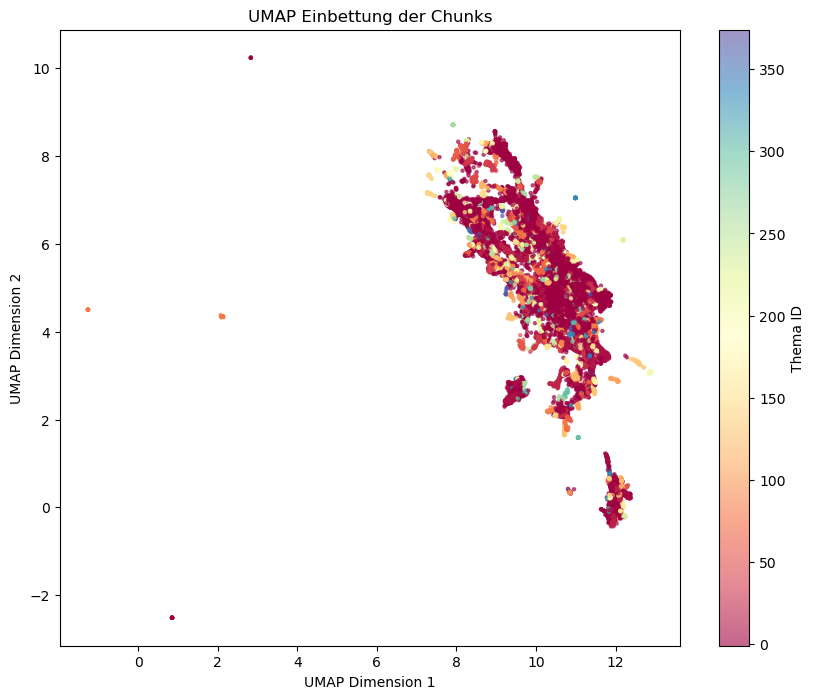

In [38]:
import matplotlib.pyplot as plt

# 1. Die bereits berechneten 2D-Koordinaten direkt aus BERTopic ziehen
umap_embeddings = topic_model.umap_model.embedding_

# 2. Scatterplot erstellen (Variablen an deinen Code angepasst)
plt.figure(figsize=(10, 8))
plt.scatter(
    umap_embeddings[:, 0], 
    umap_embeddings[:, 1], 
    c=topics,          # Deine Variable aus fit_transform
    cmap='Spectral', 
    s=5, 
    alpha=0.6
)
plt.colorbar(label='Thema ID')
plt.title('UMAP Einbettung der Chunks')
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')

plt.show()

In [39]:
fig1 = topic_model.visualize_topics()
fig1.write_html("topics_visualisierung_seed_sätze.html")
fig1.show()

In [40]:
#   TEST 2

umap_model = UMAP(
    n_neighbors= 15,  # 8
    n_components= 4,    # 5
    min_dist=0.0,
    metric="cosine",
    random_state=42
)

hdbscan_model = HDBSCAN(
    min_cluster_size=12,
    min_samples=4,
    metric="euclidean",
    cluster_selection_method="eom",
    prediction_data=True
)

vectorizer_model = CountVectorizer(
    stop_words=stoppwörter,
    ngram_range=(1, 2),
    max_df=0.2
)

# c-TF-IDF definieren  ==> 'reduce_frequent_words' aktiviert die automatische Herabstufung von parteiübergreifenden Floskeln
# bm25_weighting ==> Kompensation der Dokumentenlänge
ctfidf_model = ClassTfidfTransformer(reduce_frequent_words=True, bm25_weighting=True)   # ggf. Parameter einbinden 'seed_multiplier=2'

#Dem Modell mitteilen, dass es standardmäßig die Clustering-Task nutzen soll
# Dadurch wird bei jedem internen Aufruf von BERTopic automatisch der richtige LoRA-Adapter gewählt.
embedding_model.encode_kwargs = {"task": "separation"}

# Guided BERTopic initialisieren
topic_model = BERTopic(
    embedding_model=embedding_model,
    umap_model=umap_model,
    hdbscan_model=hdbscan_model,
    vectorizer_model=vectorizer_model,
    seed_topic_list=seed_topic_list,   # die 13 Kategorien
    calculate_probabilities=False,  # True auch möglich
    nr_topics='auto',
    verbose=True
)

# Modell trainieren
topics, probabilities = topic_model.fit_transform(alle_chunks)

2026-09-04 19:43:11,615 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/1432 [00:00<?, ?it/s]

2026-09-04 19:44:42,673 - BERTopic - Embedding - Completed ✓
2026-09-04 19:44:42,674 - BERTopic - Guided - Find embeddings highly related to seeded topics.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2026-09-04 19:44:43,039 - BERTopic - Guided - Completed ✓
2026-09-04 19:44:43,039 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2026-09-04 19:45:26,782 - BERTopic - Dimensionality - Completed ✓
2026-09-04 19:45:26,786 - BERTopic - Cluster - Start clustering the reduced embeddings
2026-09-04 19:45:28,894 - BERTopic - Cluster - Completed ✓
2026-09-04 19:45:28,895 - BERTopic - Representation - Extracting topics using c-TF-IDF for topic reduction.
2026-09-04 19:46:22,889 - BERTopic - Representation - Completed ✓
2026-09-04 19:46:22,915 - BERTopic - Topic reduction - Reducing number of topics
2026-09-04 19:46:23,654 - BERTopic - Representation - Fine-tuning topics using representation models.
2026-09-04 19:47:17,787 - BERTopic - Representation - Completed ✓
2026-09-04 19:47:17,817 - BERTopic - Topic reduction - Reduced number of topics from 498 to 307


In [41]:
# ============================================================
# 1. Ursprüngliche BERTopic-Zuordnung & Wahrscheinlichkeiten speichern
# ============================================================

topics_original = topic_model.topics_
probabilities_original = topic_model.probabilities_ 

print("Anzahl Chunks:", len(alle_chunks))
print("Outlier vorher:", sum(t == -1 for t in topics_original))

# ============================================================
# 2. Outlier reduzieren, Threshold 70%
# ============================================================

topics_reduced_outliers = topic_model.reduce_outliers(
    alle_chunks,
    topics_original,
    strategy="embeddings",
    threshold=0.70
)

print(
    "Outlier nach reduce_outliers:",
    sum(t == -1 for t in topics_reduced_outliers)
)

# ============================================================
# 3. Aktualisierte Topic-Zuordnung in BERTopic übernehmen
# ============================================================

topic_model.update_topics(
    alle_chunks,
    topics=topics_reduced_outliers,
    vectorizer_model=vectorizer_model
)

topics_x = topic_model.topics_

# ============================================================
# 4. Informationen über die Cluster
# ============================================================

topic_info_x = topic_model.get_topic_info()

print(
    topic_info_x[
        ["Topic", "Count", "Name"]
    ].sort_values("Count", ascending=False)
)

Anzahl Chunks: 45802
Outlier vorher: 16520


2026-09-04 19:47:55,239 - BERTopic - WARNING: Using a custom list of topic assignments may lead to errors if topic reduction techniques are used afterwards. Make sure that manually assigning topics is the last step in the pipeline.Note that topic embeddings will also be created through weightedc-TF-IDF embeddings instead of centroid embeddings.


Outlier nach reduce_outliers: 3370
     Topic  Count                                               Name
1        0   4595  0_schuldenbremse_bürgergeld_bürokratieabbau_na...
0       -1   3370                 -1_friedrich_abkommen_trump_donald
2        1   2903                  1_putin_nato_russischen_russische
3        2   2172  2_energien_erneuerbaren_erneuerbaren energien_gas
4        3   1256                3_israel_hamas_antisemitismus_juden
..     ...    ...                                                ...
300    299     16                    299_long covid_long_covid_mecfs
273    272     16  272_aserbaidschan_klimakonferenz_politischen g...
290    289     15  289_witwenrente_hinzuverdienstgrenzen_witwen_w...
296    295     14          295_höfeordnung_erben_grundsteuerwert_hof
298    297     14  297_22 aufenthaltsgesetz_härtefallregelung_gil...

[307 rows x 3 columns]


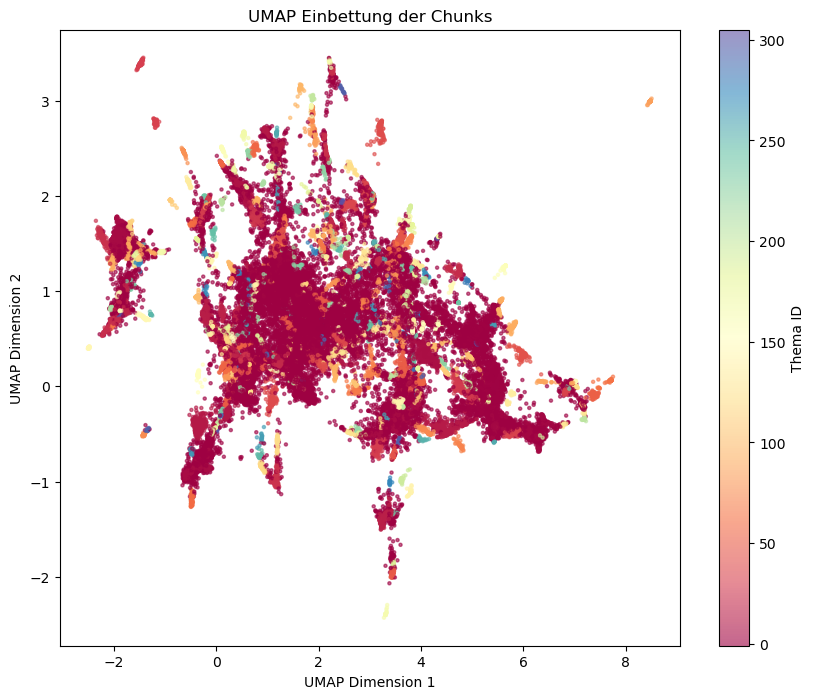

In [42]:
import matplotlib.pyplot as plt

# 1. Die bereits berechneten 2D-Koordinaten direkt aus BERTopic ziehen
umap_embeddings = topic_model.umap_model.embedding_

# 2. Scatterplot erstellen (Variablen an deinen Code angepasst)
plt.figure(figsize=(10, 8))
plt.scatter(
    umap_embeddings[:, 0], 
    umap_embeddings[:, 1], 
    c=topics,          # Deine Variable aus fit_transform
    cmap='Spectral', 
    s=5, 
    alpha=0.6
)
plt.colorbar(label='Thema ID')
plt.title('UMAP Einbettung der Chunks')
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')

plt.show()

In [43]:
fig1 = topic_model.visualize_topics()
fig1.write_html("topics_visualisierung_seed_sätze.html")
fig1.show()

In [44]:
#   TEST 3

umap_model = UMAP(
    n_neighbors= 30,  # 15, 8
    n_components= 2,    # 4, 5
    min_dist=0.0,
    metric="cosine",
    random_state=42
)

hdbscan_model = HDBSCAN(
    min_cluster_size=15,   # 12
    min_samples=4,           # 4
    metric="euclidean",
    cluster_selection_method="eom",
    prediction_data=True
)

vectorizer_model = CountVectorizer(
    stop_words=stoppwörter,
    ngram_range=(1, 2),
    max_df=0.2
)

vectorizer_model = CountVectorizer(
    stop_words=stoppwörter,
    ngram_range=(1, 2),
    max_df=0.2
)

# c-TF-IDF definieren  ==> 'reduce_frequent_words' aktiviert die automatische Herabstufung von parteiübergreifenden Floskeln
# bm25_weighting ==> Kompensation der Dokumentenlänge
ctfidf_model = ClassTfidfTransformer(reduce_frequent_words=True, bm25_weighting=True)   # ggf. Parameter einbinden 'seed_multiplier=2'

#Dem Modell mitteilen, dass es standardmäßig die Clustering-Task nutzen soll
# Dadurch wird bei jedem internen Aufruf von BERTopic automatisch der richtige LoRA-Adapter gewählt.
embedding_model.encode_kwargs = {"task": "separation"}

# Guided BERTopic initialisieren
topic_model = BERTopic(
    embedding_model=embedding_model,
    umap_model=umap_model,
    hdbscan_model=hdbscan_model,
    vectorizer_model=vectorizer_model,
    seed_topic_list=seed_topic_list,   # die 13 Kategorien
    calculate_probabilities=False,  # True auch möglich
    nr_topics='auto',
    verbose=True
)

# Modell trainieren
topics, probabilities = topic_model.fit_transform(alle_chunks)

2026-09-04 19:48:51,245 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/1432 [00:00<?, ?it/s]

2026-09-04 19:50:21,988 - BERTopic - Embedding - Completed ✓
2026-09-04 19:50:21,990 - BERTopic - Guided - Find embeddings highly related to seeded topics.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2026-09-04 19:50:22,360 - BERTopic - Guided - Completed ✓
2026-09-04 19:50:22,361 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2026-09-04 19:51:25,294 - BERTopic - Dimensionality - Completed ✓
2026-09-04 19:51:25,297 - BERTopic - Cluster - Start clustering the reduced embeddings
2026-09-04 19:51:27,113 - BERTopic - Cluster - Completed ✓
2026-09-04 19:51:27,114 - BERTopic - Representation - Extracting topics using c-TF-IDF for topic reduction.
2026-09-04 19:52:20,609 - BERTopic - Representation - Completed ✓
2026-09-04 19:52:20,629 - BERTopic - Topic reduction - Reducing number of topics
2026-09-04 19:52:21,164 - BERTopic - Representation - Fine-tuning topics using representation models.
2026-09-04 19:53:15,130 - BERTopic - Representation - Completed ✓
2026-09-04 19:53:15,156 - BERTopic - Topic reduction - Reduced number of topics from 415 to 202


In [45]:
# ============================================================
# 1. Ursprüngliche BERTopic-Zuordnung & Wahrscheinlichkeiten speichern
# ============================================================

topics_original = topic_model.topics_
probabilities_original = topic_model.probabilities_ 

print("Anzahl Chunks:", len(alle_chunks))
print("Outlier vorher:", sum(t == -1 for t in topics_original))

# ============================================================
# 2. Outlier reduzieren, Threshold 70%
# ============================================================

topics_reduced_outliers = topic_model.reduce_outliers(
    alle_chunks,
    topics_original,
    strategy="embeddings",
    threshold=0.70
)

print(
    "Outlier nach reduce_outliers:",
    sum(t == -1 for t in topics_reduced_outliers)
)

# ============================================================
# 3. Aktualisierte Topic-Zuordnung in BERTopic übernehmen
# ============================================================

topic_model.update_topics(
    alle_chunks,
    topics=topics_reduced_outliers,
    vectorizer_model=vectorizer_model
)

topics_x = topic_model.topics_

# ============================================================
# 4. Informationen über die Cluster
# ============================================================

topic_info_x = topic_model.get_topic_info()

print(
    topic_info_x[
        ["Topic", "Count", "Name"]
    ].sort_values("Count", ascending=False)
)

Anzahl Chunks: 45802
Outlier vorher: 11875


2026-09-04 19:53:41,849 - BERTopic - WARNING: Using a custom list of topic assignments may lead to errors if topic reduction techniques are used afterwards. Make sure that manually assigning topics is the last step in the pipeline.Note that topic embeddings will also be created through weightedc-TF-IDF embeddings instead of centroid embeddings.


Outlier nach reduce_outliers: 3615
     Topic  Count                                               Name
1        0  10155  0_erneuerbaren_bürgergeld_strom_erneuerbaren e...
0       -1   3615        -1_klimakrise_covid_erneuerbaren_long covid
2        1   2651                      1_putin_nato_russische_putins
3        2   2274  2_migrationspolitik_grenzkontrollen_abschiebun...
4        3   1494                3_israel_antisemitismus_hamas_juden
..     ...    ...                                                ...
188    187     23   187_reparatur_recht reparatur_updates_hersteller
198    197     22  197_taskforce_islamismusprävention_extremismus...
183    182     21  182_schweiz_polizeivertrag_schweizerischen_ver...
184    183     21  183_einsamkeit_einsamkeitsstrategie_thema eins...
197    196     19  196_aserbaidschan_klimakonferenz_politischen g...

[202 rows x 3 columns]


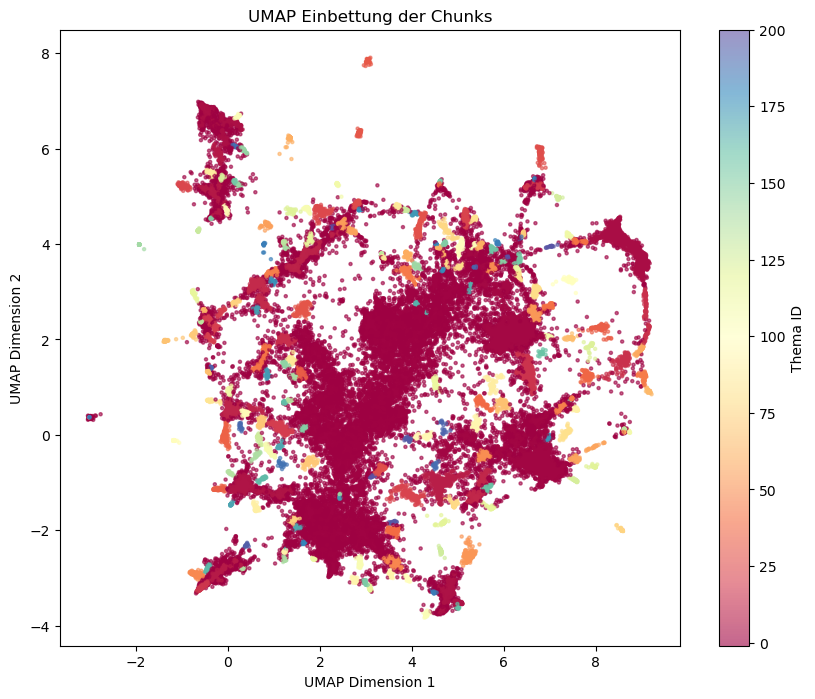

In [46]:
import matplotlib.pyplot as plt

# 1. Die bereits berechneten 2D-Koordinaten direkt aus BERTopic ziehen
umap_embeddings = topic_model.umap_model.embedding_

# 2. Scatterplot erstellen (Variablen an deinen Code angepasst)
plt.figure(figsize=(10, 8))
plt.scatter(
    umap_embeddings[:, 0], 
    umap_embeddings[:, 1], 
    c=topics,          # Deine Variable aus fit_transform
    cmap='Spectral', 
    s=5, 
    alpha=0.6
)
plt.colorbar(label='Thema ID')
plt.title('UMAP Einbettung der Chunks')
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')

plt.show()

In [47]:
fig1 = topic_model.visualize_topics()
fig1.write_html("topics_visualisierung_seed_sätze.html")
fig1.show()

In [48]:
#   TEST 4

umap_model = UMAP(
    n_neighbors= 40,  # 30, 15, 8
    n_components= 2,    # 4, 5
    min_dist=0.0,
    metric="cosine",
    random_state=42
)

hdbscan_model = HDBSCAN(
    min_cluster_size=15,   # 12
    min_samples=4,           # 4
    metric="euclidean",
    cluster_selection_method="eom",
    prediction_data=True
)


vectorizer_model = CountVectorizer(
    stop_words=stoppwörter,
    ngram_range=(1, 2),
    max_df=0.2
)

# c-TF-IDF definieren  ==> 'reduce_frequent_words' aktiviert die automatische Herabstufung von parteiübergreifenden Floskeln
# bm25_weighting ==> Kompensation der Dokumentenlänge
ctfidf_model = ClassTfidfTransformer(reduce_frequent_words=True, bm25_weighting=True)   # ggf. Parameter einbinden 'seed_multiplier=2'

#Dem Modell mitteilen, dass es standardmäßig die Clustering-Task nutzen soll
# Dadurch wird bei jedem internen Aufruf von BERTopic automatisch der richtige LoRA-Adapter gewählt.
embedding_model.encode_kwargs = {"task": "separation"}

# Guided BERTopic initialisieren
topic_model = BERTopic(
    embedding_model=embedding_model,
    umap_model=umap_model,
    hdbscan_model=hdbscan_model,
    vectorizer_model=vectorizer_model,
    seed_topic_list=seed_topic_list,   # die 13 Kategorien
    calculate_probabilities=False,  # True auch möglich
    nr_topics='auto',
    verbose=True
)

# Modell trainieren
topics, probabilities = topic_model.fit_transform(alle_chunks)

2026-09-04 19:54:37,230 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/1432 [00:00<?, ?it/s]

2026-09-04 19:56:09,043 - BERTopic - Embedding - Completed ✓
2026-09-04 19:56:09,044 - BERTopic - Guided - Find embeddings highly related to seeded topics.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2026-09-04 19:56:09,400 - BERTopic - Guided - Completed ✓
2026-09-04 19:56:09,401 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2026-09-04 19:57:26,172 - BERTopic - Dimensionality - Completed ✓
2026-09-04 19:57:26,175 - BERTopic - Cluster - Start clustering the reduced embeddings
2026-09-04 19:57:27,993 - BERTopic - Cluster - Completed ✓
2026-09-04 19:57:27,995 - BERTopic - Representation - Extracting topics using c-TF-IDF for topic reduction.
2026-09-04 19:58:22,064 - BERTopic - Representation - Completed ✓
2026-09-04 19:58:22,088 - BERTopic - Topic reduction - Reducing number of topics
2026-09-04 19:58:22,622 - BERTopic - Representation - Fine-tuning topics using representation models.
2026-09-04 19:59:17,033 - BERTopic - Representation - Completed ✓
2026-09-04 19:59:17,059 - BERTopic - Topic reduction - Reduced number of topics from 414 to 211


In [49]:
# ============================================================
# 1. Ursprüngliche BERTopic-Zuordnung & Wahrscheinlichkeiten speichern
# ============================================================

topics_original = topic_model.topics_
probabilities_original = topic_model.probabilities_ 

print("Anzahl Chunks:", len(alle_chunks))
print("Outlier vorher:", sum(t == -1 for t in topics_original))

# ============================================================
# 2. Outlier reduzieren, Threshold 70%
# ============================================================

topics_reduced_outliers = topic_model.reduce_outliers(
    alle_chunks,
    topics_original,
    strategy="embeddings",
    threshold=0.70
)

print(
    "Outlier nach reduce_outliers:",
    sum(t == -1 for t in topics_reduced_outliers)
)

# ============================================================
# 3. Aktualisierte Topic-Zuordnung in BERTopic übernehmen
# ============================================================

topic_model.update_topics(
    alle_chunks,
    topics=topics_reduced_outliers,
    vectorizer_model=vectorizer_model
)

topics_x = topic_model.topics_

# ============================================================
# 4. Informationen über die Cluster
# ============================================================

topic_info_x = topic_model.get_topic_info()

print(
    topic_info_x[
        ["Topic", "Count", "Name"]
    ].sort_values("Count", ascending=False)
)

Anzahl Chunks: 45802
Outlier vorher: 13023


2026-09-04 19:59:46,164 - BERTopic - WARNING: Using a custom list of topic assignments may lead to errors if topic reduction techniques are used afterwards. Make sure that manually assigning topics is the last step in the pipeline.Note that topic embeddings will also be created through weightedc-TF-IDF embeddings instead of centroid embeddings.


Outlier nach reduce_outliers: 3415
     Topic  Count                                               Name
1        0   8839  0_erneuerbaren_bürgergeld_wasserstoff_erneuerb...
0       -1   3415  -1_erneuerbaren_covid_erneuerbaren energien_lo...
2        1   2054  1_migrationspolitik_geflüchteten_grenzkontroll...
3        2   1485                2_israel_antisemitismus_hamas_juden
4        3   1429  3_nato_ukrainischen_unterstützung ukraine_wlad...
..     ...    ...                                                ...
182    181     27  181_aserbaidschan_klimakonferenz_politischen g...
204    203     26  203_finanzmarktdigitalisierungsgesetz_dora_fin...
210    209     21  209_reallabore_regulatorisches_regulatorisches...
203    202     20   202_englisch_commercial_commercial courts_courts
196    195     19  195_einsamkeit_thema einsamkeit_einsamkeitsstr...

[211 rows x 3 columns]


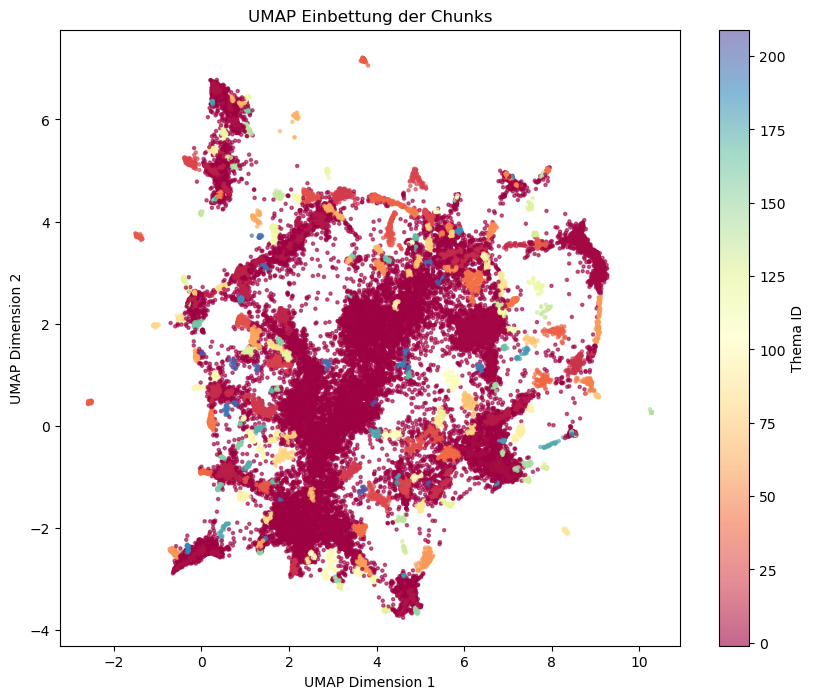

In [50]:
import matplotlib.pyplot as plt

# 1. Die bereits berechneten 2D-Koordinaten direkt aus BERTopic ziehen
umap_embeddings = topic_model.umap_model.embedding_

# 2. Scatterplot erstellen (Variablen an deinen Code angepasst)
plt.figure(figsize=(10, 8))
plt.scatter(
    umap_embeddings[:, 0], 
    umap_embeddings[:, 1], 
    c=topics,          # Deine Variable aus fit_transform
    cmap='Spectral', 
    s=5, 
    alpha=0.6
)
plt.colorbar(label='Thema ID')
plt.title('UMAP Einbettung der Chunks')
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')

plt.show()

In [51]:
fig1 = topic_model.visualize_topics()
fig1.write_html("topics_visualisierung_seed_sätze.html")
fig1.show()

In [52]:
########### von Chunk-Größe 800 auf 2400 ##############
def split_text(text):
    # chunk_size: Maximale Zeichenanzahl pro Abschnitt
    # chunk_overlap: Wie viele Zeichen vom vorherigen Abschnitt wiederholt werden
    splitter = RecursiveCharacterTextSplitter(
        chunk_size=2400,       # -> entspricht ca. 100 Wörtern
        chunk_overlap=100,       # keine chun_overlap
        separators = ["\n\n", "\n", ". ", "? ", "! ", " ", ""] # Sucht erst nach Absätzen, dann Sätzen, dann Wörtern
    )

    # Gibt eine Liste von Strings zurück
    return splitter.split_text(text)

# Wahlprogramme nicht in chunks aufteilen; Annahme: Absätze behandeln i.d.R. ein Thema
CDU_WP_chunks = CDU_text
SPD_WP_chunks = SPD_text
Grüne_WP_chunks = Grüne_text
AfD_WP_chunks = AfD_text
Linke_WP_chunks = Linke_text
FDP_WP_chunks = FDP_text

# in integer verwandeln, wichtig für später zur Berechnung der Themenanteile

CDU_WP_chunks_len = len(CDU_WP_chunks)
SPD_WP_chunks_len = len(SPD_WP_chunks)
Grüne_WP_chunks_len = len(Grüne_WP_chunks)
AfD_WP_chunks_len = len(AfD_WP_chunks)
Linke_WP_chunks_len = len(Linke_WP_chunks)
FDP_WP_chunks_len = len(FDP_WP_chunks)

CDU_anteil = kehrwert_cdu
SPD_anteil = kehrwert_spd
Linke_anteil = kehrwert_linke
Grüne_anteil = kehrwert_grüne
AfD_anteil = kehrwert_afd
FDP_anteil = kehrwert_fdp

# Bundestagsreden in chunks aufteilen von 800 Zeichen, ohne chunk_overlap

CDU_1_chunks = [chunk for rede in text_liste_CDU_1_clean for chunk in split_text(rede)]
CDU_2_chunks = [chunk for rede in text_liste_CDU_2_clean for chunk in split_text(rede)]
CDU_3_chunks = [chunk for rede in text_liste_CDU_3_clean for chunk in split_text(rede)]
CDU_4_chunks = [chunk for rede in text_liste_CDU_4_clean for chunk in split_text(rede)]
CDU_5_chunks = [chunk for rede in text_liste_CDU_5_clean for chunk in split_text(rede)]

SPD_1_chunks = [chunk for rede in text_liste_SPD_1_clean for chunk in split_text(rede)]
SPD_2_chunks = [chunk for rede in text_liste_SPD_2_clean for chunk in split_text(rede)]
SPD_3_chunks = [chunk for rede in text_liste_SPD_3_clean for chunk in split_text(rede)]
SPD_4_chunks = [chunk for rede in text_liste_SPD_4_clean for chunk in split_text(rede)]
SPD_5_chunks = [chunk for rede in text_liste_SPD_5_clean for chunk in split_text(rede)]

Linke_1_chunks = [chunk for rede in text_liste_Linke_1_clean for chunk in split_text(rede)]
Linke_2_chunks = [chunk for rede in text_liste_Linke_2_clean for chunk in split_text(rede)]
Linke_3_chunks = [chunk for rede in text_liste_Linke_3_clean for chunk in split_text(rede)]
Linke_4_chunks = [chunk for rede in text_liste_Linke_4_clean for chunk in split_text(rede)]
Linke_5_chunks = [chunk for rede in text_liste_Linke_5_clean for chunk in split_text(rede)]

Grüne_1_chunks = [chunk for rede in text_liste_Grüne_1_clean for chunk in split_text(rede)]
Grüne_2_chunks = [chunk for rede in text_liste_Grüne_2_clean for chunk in split_text(rede)]
Grüne_3_chunks = [chunk for rede in text_liste_Grüne_3_clean for chunk in split_text(rede)]
Grüne_4_chunks = [chunk for rede in text_liste_Grüne_4_clean for chunk in split_text(rede)]
Grüne_5_chunks = [chunk for rede in text_liste_Grüne_5_clean for chunk in split_text(rede)]
# Grüne_5_chunks = split_text(text_liste_Grüne_5_str)

AfD_1_chunks = [chunk for rede in text_liste_AfD_1_clean for chunk in split_text(rede)]
AfD_2_chunks = [chunk for rede in text_liste_AfD_2_clean for chunk in split_text(rede)]
AfD_3_chunks = [chunk for rede in text_liste_AfD_3_clean for chunk in split_text(rede)]
AfD_4_chunks = [chunk for rede in text_liste_AfD_4_clean for chunk in split_text(rede)]
AfD_5_chunks = [chunk for rede in text_liste_AfD_5_clean for chunk in split_text(rede)]

FDP_1_chunks = [chunk for rede in text_liste_FDP_1_clean for chunk in split_text(rede)]
FDP_2_chunks = [chunk for rede in text_liste_FDP_2_clean for chunk in split_text(rede)]
FDP_3_chunks = [chunk for rede in text_liste_FDP_3_clean for chunk in split_text(rede)]
FDP_4_chunks = [chunk for rede in text_liste_FDP_4_clean for chunk in split_text(rede)]

# in integer verwandeln, wichtig für später zur Berechnung der Themenanteile

CDU_1_chunks_len = len(CDU_1_chunks)
CDU_2_chunks_len = len(CDU_2_chunks)
CDU_3_chunks_len = len(CDU_3_chunks)
CDU_4_chunks_len = len(CDU_4_chunks)
CDU_5_chunks_len = len(CDU_5_chunks)

SPD_1_chunks_len = len(SPD_1_chunks)
SPD_2_chunks_len = len(SPD_2_chunks)
SPD_3_chunks_len = len(SPD_3_chunks)
SPD_4_chunks_len = len(SPD_4_chunks)
SPD_5_chunks_len = len(SPD_5_chunks)

Grüne_1_chunks_len = len(Grüne_1_chunks)
Grüne_2_chunks_len = len(Grüne_2_chunks)
Grüne_3_chunks_len = len(Grüne_3_chunks)
Grüne_4_chunks_len = len(Grüne_4_chunks)
Grüne_5_chunks_len = len(Grüne_5_chunks)

Linke_1_chunks_len = len(Linke_1_chunks)
Linke_2_chunks_len = len(Linke_2_chunks)
Linke_3_chunks_len = len(Linke_3_chunks)
Linke_4_chunks_len = len(Linke_4_chunks)
Linke_5_chunks_len = len(Linke_5_chunks)

AfD_1_chunks_len = len(AfD_1_chunks)
AfD_2_chunks_len = len(AfD_2_chunks)
AfD_3_chunks_len = len(AfD_3_chunks)
AfD_4_chunks_len = len(AfD_4_chunks)
AfD_5_chunks_len = len(AfD_5_chunks)

FDP_1_chunks_len = len(FDP_1_chunks)
FDP_2_chunks_len = len(FDP_2_chunks)
FDP_3_chunks_len = len(FDP_3_chunks)
FDP_4_chunks_len = len(FDP_4_chunks)

# 1. Chunks aller Parteien kombinieren
alle_chunks = (CDU_WP_chunks + CDU_1_chunks + CDU_2_chunks + CDU_3_chunks + CDU_4_chunks + CDU_5_chunks +
SPD_WP_chunks + SPD_1_chunks + SPD_2_chunks + SPD_3_chunks + SPD_4_chunks + SPD_5_chunks +
Grüne_WP_chunks + Grüne_1_chunks + Grüne_2_chunks + Grüne_3_chunks + Grüne_4_chunks + Grüne_5_chunks +
AfD_WP_chunks + AfD_1_chunks + AfD_2_chunks + AfD_3_chunks + AfD_4_chunks + AfD_5_chunks +
Linke_WP_chunks + Linke_1_chunks + Linke_2_chunks + Linke_3_chunks + Linke_4_chunks + Linke_5_chunks +
FDP_WP_chunks + FDP_1_chunks + FDP_2_chunks + FDP_3_chunks + FDP_4_chunks)

# Parteilabels

partei_labels = (
    ["CDU/CSU"] * CDU_WP_chunks_len + ["CDU/CSU"] * CDU_1_chunks_len + ["CDU/CSU"] * CDU_2_chunks_len + ["CDU/CSU"] * CDU_3_chunks_len + ["CDU/CSU"] * CDU_4_chunks_len + ["CDU/CSU"] * CDU_5_chunks_len +
    ["SPD"] * SPD_WP_chunks_len + ["SPD"] * SPD_1_chunks_len + ["SPD"] * SPD_2_chunks_len + ["SPD"] * SPD_3_chunks_len + ["SPD"] * SPD_4_chunks_len + ["SPD"] * SPD_5_chunks_len +
    ["Grüne"] * Grüne_WP_chunks_len + ["Grüne"] * Grüne_1_chunks_len + ["Grüne"] * Grüne_2_chunks_len + ["Grüne"] * Grüne_3_chunks_len + ["Grüne"] * Grüne_4_chunks_len + ["Grüne"] * Grüne_5_chunks_len +
    ["Linke"] * Linke_WP_chunks_len + ["Linke"] * Linke_1_chunks_len + ["Linke"] * Linke_2_chunks_len + ["Linke"] * Linke_3_chunks_len + ["Linke"] * Linke_4_chunks_len + ["Linke"] * Linke_5_chunks_len +
    ["AfD"] * AfD_WP_chunks_len + ["AfD"] * AfD_1_chunks_len + ["AfD"] * AfD_2_chunks_len + ["AfD"] * AfD_3_chunks_len + ["AfD"] * AfD_4_chunks_len + ["AfD"] * AfD_5_chunks_len +
    ["FDP"] * FDP_WP_chunks_len + ["FDP"] * FDP_1_chunks_len + ["FDP"] * FDP_2_chunks_len + ["FDP"] * FDP_3_chunks_len + ["FDP"] * FDP_4_chunks_len
)

seed_documents = [
    sentence
    for topic in seed_topic_list
    for sentence in topic
]

seed_topic_labels = []

for topic_id, topic in enumerate(seed_topic_list):
    seed_topic_labels.extend(
        [topic_id] * len(topic)
    )


In [53]:
ctfidf_model = ClassTfidfTransformer(reduce_frequent_words=True, bm25_weighting=True)   # ggf. Parameter einbinden 'seed_multiplier=2'
embedding_model.encode_kwargs = {"task": "separation"}
topic_model = BERTopic(
    embedding_model=embedding_model,
    umap_model=umap_model,
    hdbscan_model=hdbscan_model,
    vectorizer_model=vectorizer_model,
    seed_topic_list=seed_topic_list,   # die 13 Kategorien
    calculate_probabilities=False,  # True auch möglich
    nr_topics='auto',
    verbose=True
)
topics, probabilities = topic_model.fit_transform(alle_chunks)

2026-09-04 20:00:41,546 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/607 [00:00<?, ?it/s]

2026-09-04 20:02:14,824 - BERTopic - Embedding - Completed ✓
2026-09-04 20:02:14,826 - BERTopic - Guided - Find embeddings highly related to seeded topics.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2026-09-04 20:02:15,050 - BERTopic - Guided - Completed ✓
2026-09-04 20:02:15,050 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2026-09-04 20:02:45,269 - BERTopic - Dimensionality - Completed ✓
2026-09-04 20:02:45,271 - BERTopic - Cluster - Start clustering the reduced embeddings
2026-09-04 20:02:46,632 - BERTopic - Cluster - Completed ✓
2026-09-04 20:02:46,633 - BERTopic - Representation - Extracting topics using c-TF-IDF for topic reduction.
2026-09-04 20:03:40,066 - BERTopic - Representation - Completed ✓
2026-09-04 20:03:40,094 - BERTopic - Topic reduction - Reducing number of topics
2026-09-04 20:03:40,265 - BERTopic - Representation - Fine-tuning topics using representation models.
2026-09-04 20:04:33,924 - BERTopic - Representation - Completed ✓
2026-09-04 20:04:33,953 - BERTopic - Topic reduction - Reduced number of topics from 228 to 121


Anzahl Chunks: 19393
Outlier vorher: 4809


2026-09-04 20:04:57,601 - BERTopic - WARNING: Using a custom list of topic assignments may lead to errors if topic reduction techniques are used afterwards. Make sure that manually assigning topics is the last step in the pipeline.Note that topic embeddings will also be created through weightedc-TF-IDF embeddings instead of centroid embeddings.


Outlier nach reduce_outliers: 1910


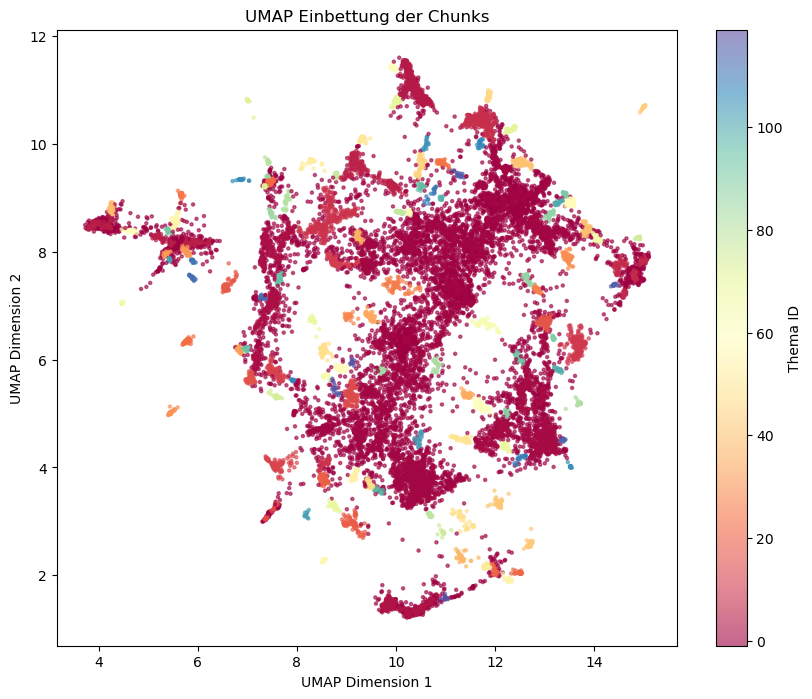

In [54]:
# TEST 5

topics_original = topic_model.topics_
probabilities_original = topic_model.probabilities_ 

print("Anzahl Chunks:", len(alle_chunks))
print("Outlier vorher:", sum(t == -1 for t in topics_original))
topics_reduced_outliers = topic_model.reduce_outliers(
    alle_chunks,
    topics_original,
    strategy="embeddings",
    threshold=0.70
)

print(
    "Outlier nach reduce_outliers:",
    sum(t == -1 for t in topics_reduced_outliers)
)
topic_model.update_topics(
    alle_chunks,
    topics=topics_reduced_outliers,
    vectorizer_model=vectorizer_model
)
topics_x = topic_model.topics_
topic_info_x = topic_model.get_topic_info()

import matplotlib.pyplot as plt

# 1. Die bereits berechneten 2D-Koordinaten direkt aus BERTopic ziehen
umap_embeddings = topic_model.umap_model.embedding_

# 2. Scatterplot erstellen (Variablen an deinen Code angepasst)
plt.figure(figsize=(10, 8))
plt.scatter(
    umap_embeddings[:, 0], 
    umap_embeddings[:, 1], 
    c=topics,          # Deine Variable aus fit_transform
    cmap='Spectral', 
    s=5, 
    alpha=0.6
)
plt.colorbar(label='Thema ID')
plt.title('UMAP Einbettung der Chunks')
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')

plt.show()

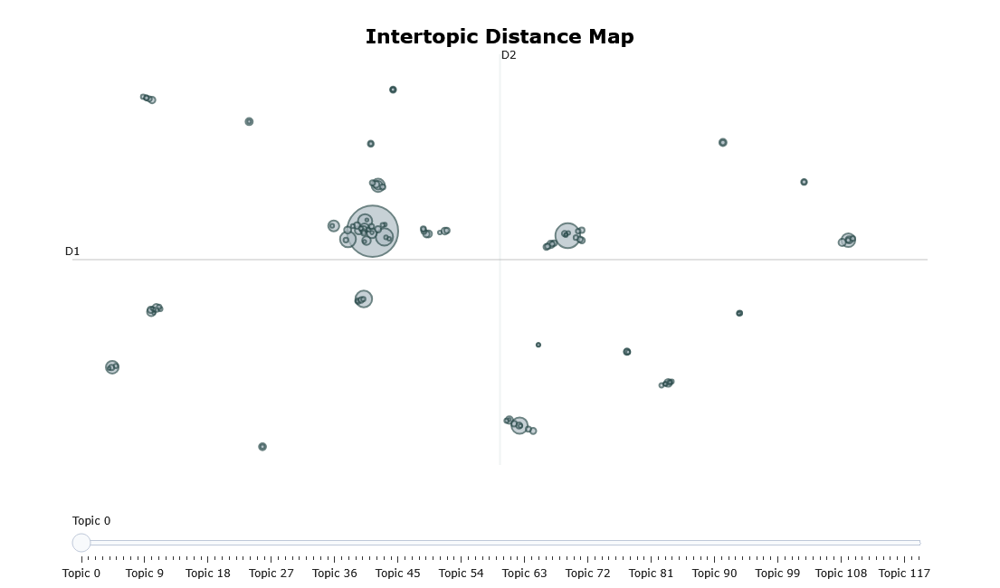

In [55]:
fig1 = topic_model.visualize_topics()
fig1.write_html("topics_visualisierung_seed_sätze.html")
fig1.show()

2026-09-04 20:05:52,336 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/607 [00:00<?, ?it/s]

2026-09-04 20:07:25,495 - BERTopic - Embedding - Completed ✓
2026-09-04 20:07:25,497 - BERTopic - Guided - Find embeddings highly related to seeded topics.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2026-09-04 20:07:25,713 - BERTopic - Guided - Completed ✓
2026-09-04 20:07:25,714 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2026-09-04 20:07:55,881 - BERTopic - Dimensionality - Completed ✓
2026-09-04 20:07:55,885 - BERTopic - Cluster - Start clustering the reduced embeddings
2026-09-04 20:07:57,257 - BERTopic - Cluster - Completed ✓
2026-09-04 20:07:57,258 - BERTopic - Representation - Extracting topics using c-TF-IDF for topic reduction.
2026-09-04 20:08:51,325 - BERTopic - Representation - Completed ✓
2026-09-04 20:08:51,342 - BERTopic - Topic reduction - Reducing number of topics
2026-09-04 20:08:51,515 - BERTopic - Representation - Fine-tuning topics using representation models.
2026-09-04 20:09:45,785 - BERTopic - Representation - Completed ✓
2026-09-04 20:09:45,805 - BERTopic - Topic reduction - Reduced number of topics from 228 to 121


Anzahl Chunks: 19393
Outlier vorher: 4809


2026-09-04 20:10:09,534 - BERTopic - WARNING: Using a custom list of topic assignments may lead to errors if topic reduction techniques are used afterwards. Make sure that manually assigning topics is the last step in the pipeline.Note that topic embeddings will also be created through weightedc-TF-IDF embeddings instead of centroid embeddings.


Outlier nach reduce_outliers: 1910


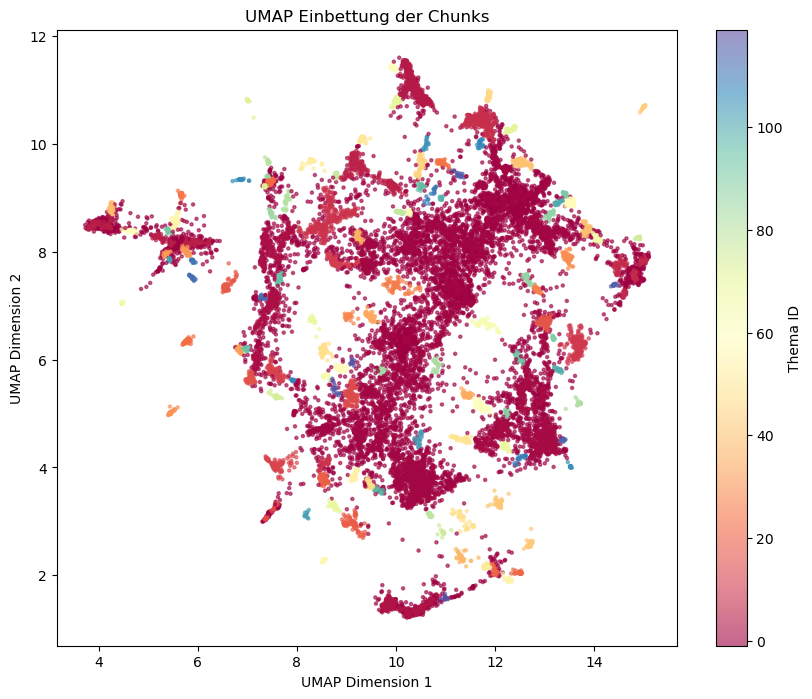

In [56]:
#   TEST 6

umap_model = UMAP(
    n_neighbors= 40,  # 30, 15, 8
    n_components= 2,    # 4, 5
    min_dist=0.0,
    metric="cosine",
    random_state=42
)

hdbscan_model = HDBSCAN(
    min_cluster_size=15,   # 12
    min_samples=4,           # 4
    metric="euclidean",
    cluster_selection_method="eom",
    prediction_data=True
)


vectorizer_model = CountVectorizer(
    stop_words=stoppwörter,
    ngram_range=(1, 2),
    max_df=0.2
)

# c-TF-IDF definieren  ==> 'reduce_frequent_words' aktiviert die automatische Herabstufung von parteiübergreifenden Floskeln
# bm25_weighting ==> Kompensation der Dokumentenlänge
ctfidf_model = ClassTfidfTransformer(reduce_frequent_words=True, bm25_weighting=True)   # ggf. Parameter einbinden 'seed_multiplier=2'

#Dem Modell mitteilen, dass es standardmäßig die Clustering-Task nutzen soll
# Dadurch wird bei jedem internen Aufruf von BERTopic automatisch der richtige LoRA-Adapter gewählt.
embedding_model.encode_kwargs = {"task": "separation"}

# Guided BERTopic initialisieren
topic_model = BERTopic(
    embedding_model=embedding_model,
    umap_model=umap_model,
    hdbscan_model=hdbscan_model,
    vectorizer_model=vectorizer_model,
    seed_topic_list=seed_topic_list,   # die 13 Kategorien
    calculate_probabilities=False,  # True auch möglich
    nr_topics='auto',
    verbose=True
)

# Modell trainieren
topics, probabilities = topic_model.fit_transform(alle_chunks)

topics_original = topic_model.topics_
probabilities_original = topic_model.probabilities_ 

print("Anzahl Chunks:", len(alle_chunks))
print("Outlier vorher:", sum(t == -1 for t in topics_original))
topics_reduced_outliers = topic_model.reduce_outliers(
    alle_chunks,
    topics_original,
    strategy="embeddings",
    threshold=0.70
)

print(
    "Outlier nach reduce_outliers:",
    sum(t == -1 for t in topics_reduced_outliers)
)
topic_model.update_topics(
    alle_chunks,
    topics=topics_reduced_outliers,
    vectorizer_model=vectorizer_model
)
topics_x = topic_model.topics_
topic_info_x = topic_model.get_topic_info()

import matplotlib.pyplot as plt

# 1. Die bereits berechneten 2D-Koordinaten direkt aus BERTopic ziehen
umap_embeddings = topic_model.umap_model.embedding_

# 2. Scatterplot erstellen (Variablen an deinen Code angepasst)
plt.figure(figsize=(10, 8))
plt.scatter(
    umap_embeddings[:, 0], 
    umap_embeddings[:, 1], 
    c=topics,          # Deine Variable aus fit_transform
    cmap='Spectral', 
    s=5, 
    alpha=0.6
)
plt.colorbar(label='Thema ID')
plt.title('UMAP Einbettung der Chunks')
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')

plt.show()

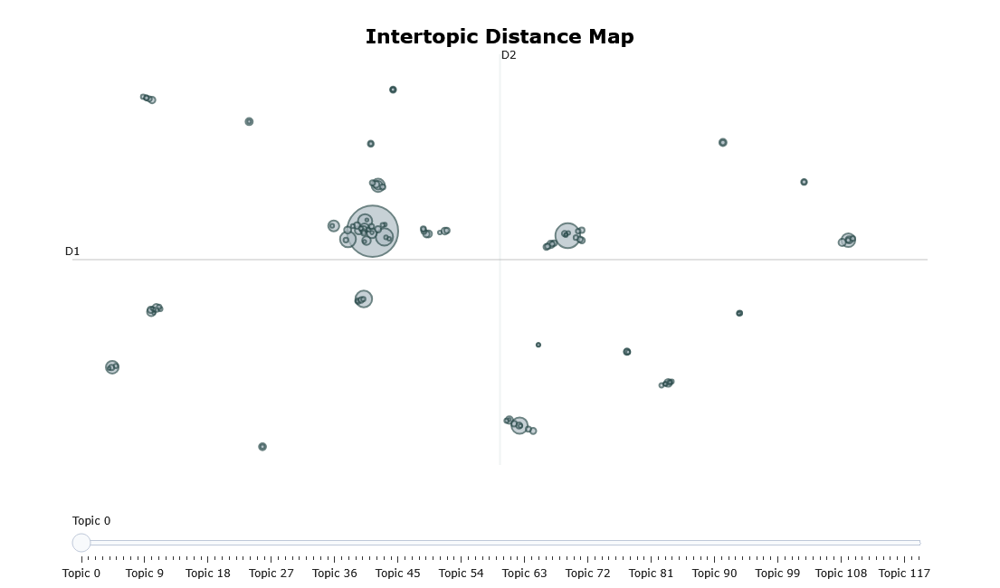

In [57]:
fig1 = topic_model.visualize_topics()
fig1.write_html("topics_visualisierung_seed_sätze.html")
fig1.show()

2026-09-04 20:11:03,774 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/607 [00:00<?, ?it/s]

2026-09-04 20:12:37,342 - BERTopic - Embedding - Completed ✓
2026-09-04 20:12:37,343 - BERTopic - Guided - Find embeddings highly related to seeded topics.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2026-09-04 20:12:37,542 - BERTopic - Guided - Completed ✓
2026-09-04 20:12:37,543 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2026-09-04 20:13:02,474 - BERTopic - Dimensionality - Completed ✓
2026-09-04 20:13:02,476 - BERTopic - Cluster - Start clustering the reduced embeddings
2026-09-04 20:13:03,830 - BERTopic - Cluster - Completed ✓
2026-09-04 20:13:03,831 - BERTopic - Representation - Extracting topics using c-TF-IDF for topic reduction.
2026-09-04 20:13:57,327 - BERTopic - Representation - Completed ✓
2026-09-04 20:13:57,345 - BERTopic - Topic reduction - Reducing number of topics
2026-09-04 20:13:57,542 - BERTopic - Representation - Fine-tuning topics using representation models.
2026-09-04 20:14:51,173 - BERTopic - Representation - Completed ✓
2026-09-04 20:14:51,198 - BERTopic - Topic reduction - Reduced number of topics from 249 to 148


Anzahl Chunks: 19393
Outlier vorher: 4916


2026-09-04 20:15:15,812 - BERTopic - WARNING: Using a custom list of topic assignments may lead to errors if topic reduction techniques are used afterwards. Make sure that manually assigning topics is the last step in the pipeline.Note that topic embeddings will also be created through weightedc-TF-IDF embeddings instead of centroid embeddings.


Outlier nach reduce_outliers: 1575


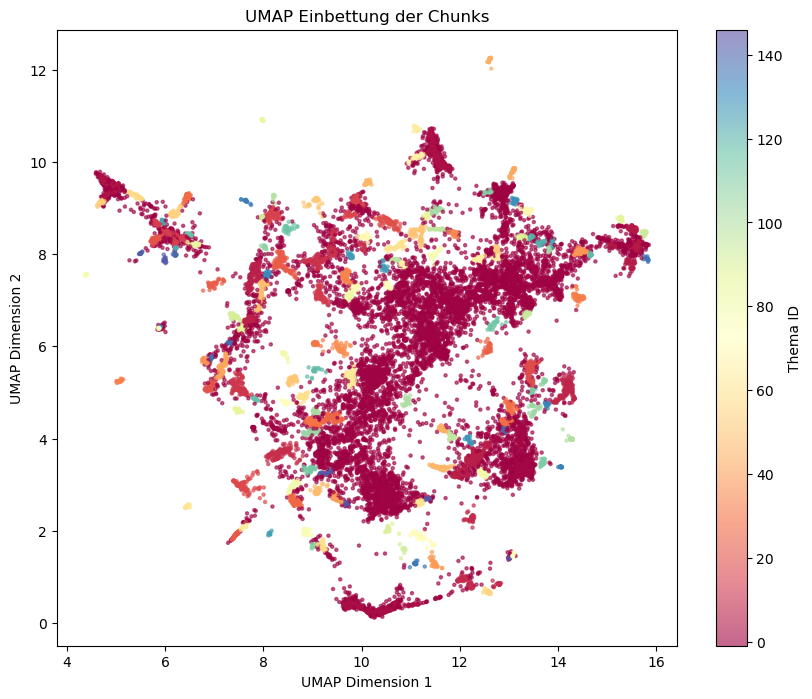

In [58]:
#   TEST 7

umap_model = UMAP(
    n_neighbors= 30,  # 15, 8
    n_components= 2,    # 4, 5
    min_dist=0.0,
    metric="cosine",
    random_state=42
)

hdbscan_model = HDBSCAN(
    min_cluster_size=15,   # 12
    min_samples=4,           # 4
    metric="euclidean",
    cluster_selection_method="eom",
    prediction_data=True
)


vectorizer_model = CountVectorizer(
    stop_words=stoppwörter,
    ngram_range=(1, 2),
    max_df=0.2
)

# c-TF-IDF definieren  ==> 'reduce_frequent_words' aktiviert die automatische Herabstufung von parteiübergreifenden Floskeln
# bm25_weighting ==> Kompensation der Dokumentenlänge
ctfidf_model = ClassTfidfTransformer(reduce_frequent_words=True, bm25_weighting=True)   # ggf. Parameter einbinden 'seed_multiplier=2'

#Dem Modell mitteilen, dass es standardmäßig die Clustering-Task nutzen soll
# Dadurch wird bei jedem internen Aufruf von BERTopic automatisch der richtige LoRA-Adapter gewählt.
embedding_model.encode_kwargs = {"task": "separation"}

# Guided BERTopic initialisieren
topic_model = BERTopic(
    embedding_model=embedding_model,
    umap_model=umap_model,
    hdbscan_model=hdbscan_model,
    vectorizer_model=vectorizer_model,
    seed_topic_list=seed_topic_list,   # die 13 Kategorien
    calculate_probabilities=False,  # True auch möglich
    nr_topics='auto',
    verbose=True
)

# Modell trainieren
topics, probabilities = topic_model.fit_transform(alle_chunks)

topics_original = topic_model.topics_
probabilities_original = topic_model.probabilities_ 

print("Anzahl Chunks:", len(alle_chunks))
print("Outlier vorher:", sum(t == -1 for t in topics_original))
topics_reduced_outliers = topic_model.reduce_outliers(
    alle_chunks,
    topics_original,
    strategy="embeddings",
    threshold=0.70
)

print(
    "Outlier nach reduce_outliers:",
    sum(t == -1 for t in topics_reduced_outliers)
)
topic_model.update_topics(
    alle_chunks,
    topics=topics_reduced_outliers,
    vectorizer_model=vectorizer_model
)
topics_x = topic_model.topics_
topic_info_x = topic_model.get_topic_info()

import matplotlib.pyplot as plt

# 1. Die bereits berechneten 2D-Koordinaten direkt aus BERTopic ziehen
umap_embeddings = topic_model.umap_model.embedding_

# 2. Scatterplot erstellen (Variablen an deinen Code angepasst)
plt.figure(figsize=(10, 8))
plt.scatter(
    umap_embeddings[:, 0], 
    umap_embeddings[:, 1], 
    c=topics,          # Deine Variable aus fit_transform
    cmap='Spectral', 
    s=5, 
    alpha=0.6
)
plt.colorbar(label='Thema ID')
plt.title('UMAP Einbettung der Chunks')
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')

plt.show()

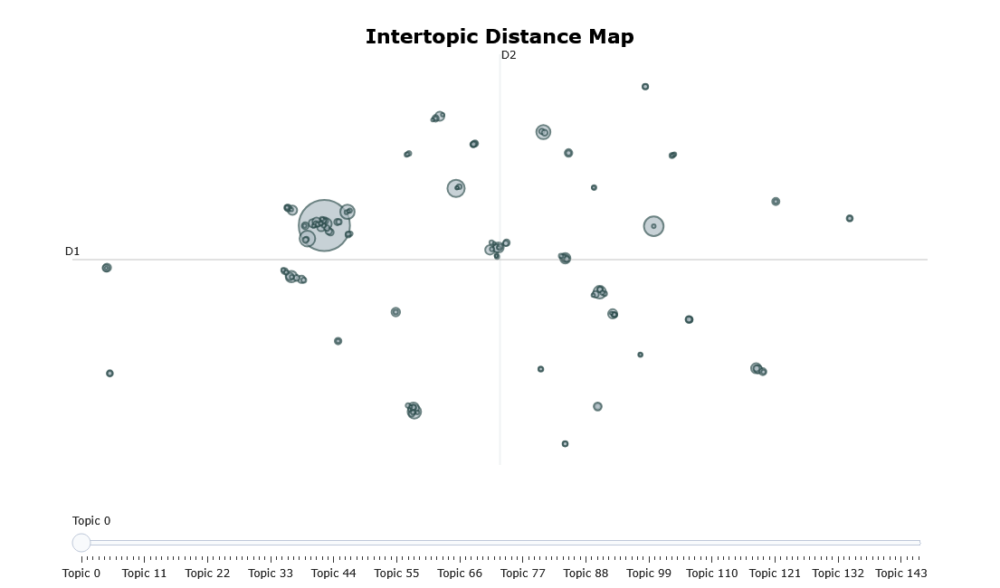

In [59]:
fig1 = topic_model.visualize_topics()
fig1.write_html("topics_visualisierung_seed_sätze.html")
fig1.show()

2026-09-04 20:16:09,840 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/607 [00:00<?, ?it/s]

2026-09-04 20:17:43,925 - BERTopic - Embedding - Completed ✓
2026-09-04 20:17:43,927 - BERTopic - Guided - Find embeddings highly related to seeded topics.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2026-09-04 20:17:44,145 - BERTopic - Guided - Completed ✓
2026-09-04 20:17:44,145 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2026-09-04 20:18:14,927 - BERTopic - Dimensionality - Completed ✓
2026-09-04 20:18:14,928 - BERTopic - Cluster - Start clustering the reduced embeddings
2026-09-04 20:18:16,270 - BERTopic - Cluster - Completed ✓
2026-09-04 20:18:16,271 - BERTopic - Representation - Extracting topics using c-TF-IDF for topic reduction.
2026-09-04 20:19:09,503 - BERTopic - Representation - Completed ✓
2026-09-04 20:19:09,524 - BERTopic - Topic reduction - Reducing number of topics
2026-09-04 20:19:09,697 - BERTopic - Representation - Fine-tuning topics using representation models.
2026-09-04 20:20:03,359 - BERTopic - Representation - Completed ✓
2026-09-04 20:20:03,384 - BERTopic - Topic reduction - Reduced number of topics from 228 to 121


Anzahl Chunks: 19393
Outlier vorher: 4809


2026-09-04 20:20:27,072 - BERTopic - WARNING: Using a custom list of topic assignments may lead to errors if topic reduction techniques are used afterwards. Make sure that manually assigning topics is the last step in the pipeline.Note that topic embeddings will also be created through weightedc-TF-IDF embeddings instead of centroid embeddings.


Outlier nach reduce_outliers: 1910


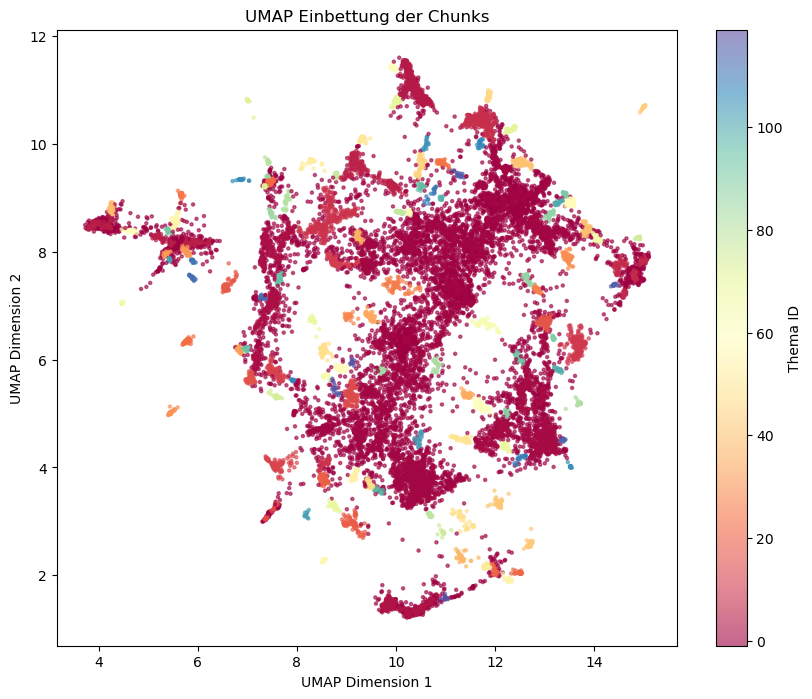

In [60]:
#   TEST 8

umap_model = UMAP(
    n_neighbors= 40,  # 30, 15, 8
    n_components= 2,    # 4, 5
    min_dist=0.0,
    metric="cosine",
    random_state=42
)

hdbscan_model = HDBSCAN(
    min_cluster_size=15,   # 12
    min_samples=4,           # 4
    metric="euclidean",
    cluster_selection_method="eom",
    prediction_data=True
)


vectorizer_model = CountVectorizer(
    stop_words=stoppwörter,
    ngram_range=(1, 2),
    max_df=0.2
)

# c-TF-IDF definieren  ==> 'reduce_frequent_words' aktiviert die automatische Herabstufung von parteiübergreifenden Floskeln
# bm25_weighting ==> Kompensation der Dokumentenlänge
ctfidf_model = ClassTfidfTransformer(reduce_frequent_words=True, bm25_weighting=True)   # ggf. Parameter einbinden 'seed_multiplier=2'

#Dem Modell mitteilen, dass es standardmäßig die Clustering-Task nutzen soll
# Dadurch wird bei jedem internen Aufruf von BERTopic automatisch der richtige LoRA-Adapter gewählt.
embedding_model.encode_kwargs = {"task": "separation"}

# Guided BERTopic initialisieren
topic_model = BERTopic(
    embedding_model=embedding_model,
    umap_model=umap_model,
    hdbscan_model=hdbscan_model,
    vectorizer_model=vectorizer_model,
    seed_topic_list=seed_topic_list,   # die 13 Kategorien
    calculate_probabilities=False,  # True auch möglich
    nr_topics='auto',
    verbose=True
)

# Modell trainieren
topics, probabilities = topic_model.fit_transform(alle_chunks)

topics_original = topic_model.topics_
probabilities_original = topic_model.probabilities_ 

print("Anzahl Chunks:", len(alle_chunks))
print("Outlier vorher:", sum(t == -1 for t in topics_original))
topics_reduced_outliers = topic_model.reduce_outliers(
    alle_chunks,
    topics_original,
    strategy="embeddings",
    threshold=0.70
)

print(
    "Outlier nach reduce_outliers:",
    sum(t == -1 for t in topics_reduced_outliers)
)
topic_model.update_topics(
    alle_chunks,
    topics=topics_reduced_outliers,
    vectorizer_model=vectorizer_model
)
topics_x = topic_model.topics_
topic_info_x = topic_model.get_topic_info()

import matplotlib.pyplot as plt

# 1. Die bereits berechneten 2D-Koordinaten direkt aus BERTopic ziehen
umap_embeddings = topic_model.umap_model.embedding_

# 2. Scatterplot erstellen (Variablen an deinen Code angepasst)
plt.figure(figsize=(10, 8))
plt.scatter(
    umap_embeddings[:, 0], 
    umap_embeddings[:, 1], 
    c=topics,          # Deine Variable aus fit_transform
    cmap='Spectral', 
    s=5, 
    alpha=0.6
)
plt.colorbar(label='Thema ID')
plt.title('UMAP Einbettung der Chunks')
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')

plt.show()

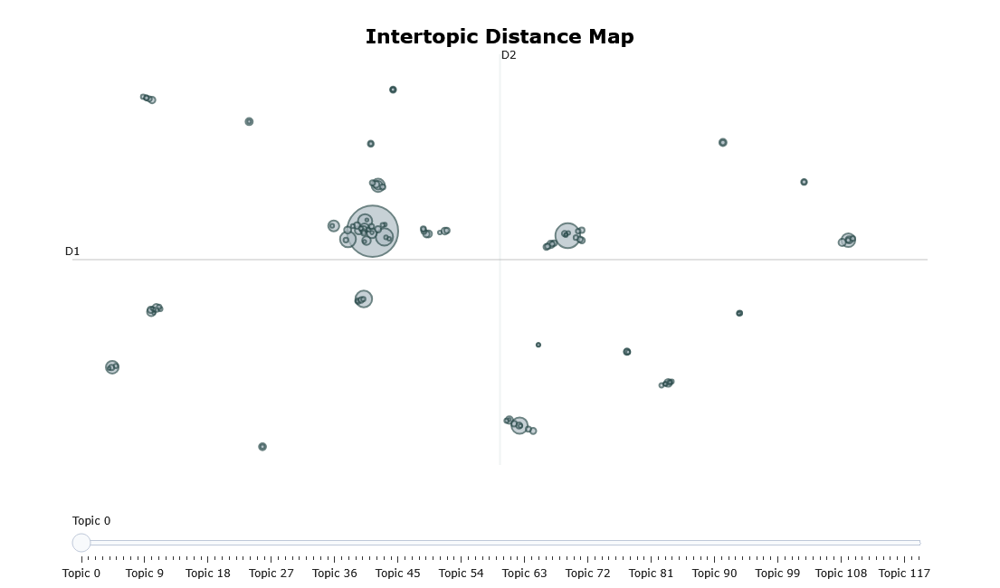

In [61]:
fig1 = topic_model.visualize_topics()
fig1.write_html("topics_visualisierung_seed_sätze.html")
fig1.show()